In [1]:
import pandas as pd
import numpy as np

In [2]:
loy = pd.read_csv('../RawData/historical_transactions.csv')

In [3]:
loy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 14 columns):
authorized_flag         103617 non-null object
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              103617 non-null object
installments            103617 non-null int64
category_3              102970 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103159 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null object
category_2              94284 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 11.1+ MB


In [4]:
loy.get_dtype_counts()

float64    2
int64      6
object     6
dtype: int64

In [5]:
loy.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_ea299331ff,200,N,0,A,690,M_ID_7ecb602096,-5,-0.351846,2017-09-15 21:15:41,2.0,18,1
1,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_e95b1970c2,-10,-0.603029,2017-04-29 09:46:35,2.0,18,33
2,Y,C_ID_ea299331ff,200,N,0,A,307,M_ID_77d5389a7e,-3,-0.656749,2017-11-29 00:00:00,2.0,18,19
3,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_e95b1970c2,-4,-0.557754,2017-10-04 13:45:29,2.0,18,33
4,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_9a24c5f117,0,-0.603375,2018-02-28 11:38:42,2.0,18,33


In [6]:
loy['card_id'].unique()

array(['C_ID_ea299331ff', 'C_ID_16e1a96d67', 'C_ID_f376c2cdd0', ...,
       'C_ID_f0975077c6', 'C_ID_8080d9dd06', 'C_ID_37e23fe25f'],
      dtype=object)

In [7]:
loy['city_id'].value_counts()

 69     17086
-1       8657
 17      4929
 158     4532
 19      3047
 331     2756
 333     2303
 87      1917
 137     1812
 57      1670
 25      1631
 161     1615
 53      1517
 88      1514
 143     1436
 160     1256
 322     1199
 76      1096
 233     1034
 286      967
 4        950
 212      853
 149      804
 277      774
 20       750
 274      737
 117      726
 344      710
 291      710
 140      691
        ...  
 123        6
 186        6
 91         6
 139        6
 220        5
 130        5
 28         5
 338        4
 182        4
 44         3
 345        3
 312        3
 142        3
 226        2
 77         2
 263        2
 71         2
 206        2
 208        2
 309        2
 197        1
 178        1
 273        1
 129        1
 254        1
 32         1
 47         1
 222        1
 183        1
 83         1
Name: city_id, Length: 296, dtype: int64

In [8]:
loy['authorized_flag'].value_counts()

Y    94755
N     8862
Name: authorized_flag, dtype: int64

In [9]:
df =  pd.read_csv('../RawData/new_merchants.csv') 

In [10]:
df.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_89f5a36cc3,69,N,2,C,879,M_ID_00a6ca8a8a,1,-0.446378,2017-06-29 17:16:52,1.0,9,29
1,Y,C_ID_89f5a36cc3,231,N,1,B,108,M_ID_e6570d8726,1,-0.634509,2017-06-20 12:15:31,1.0,9,34
2,Y,C_ID_89f5a36cc3,69,N,1,B,273,M_ID_32d73b8ecf,2,-0.626696,2017-07-20 14:21:23,1.0,9,20
3,Y,C_ID_89f5a36cc3,69,N,1,B,80,M_ID_c03b62d83d,2,-0.677786,2017-07-20 14:05:10,1.0,9,37
4,Y,C_ID_6a9d23ccea,261,N,0,A,437,M_ID_d179007279,1,-0.620460,2018-03-26 18:35:19,1.0,9,15


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 14 columns):
authorized_flag         6740 non-null object
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null object
installments            6740 non-null int64
category_3              6528 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6651 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6390 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 737.3+ KB


In [12]:
dftrain = pd.read_csv('../RawData/train.csv') 

In [13]:
dftrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 6 columns):
first_active_month    1000 non-null object
card_id               1000 non-null object
feature_1             1000 non-null int64
feature_2             1000 non-null int64
feature_3             1000 non-null int64
loyalty_score         1000 non-null float64
dtypes: float64(1), int64(3), object(2)
memory usage: 47.0+ KB


In [14]:
dftrain.head()

,first_active_month,card_id,feature_1,feature_2,feature_3,loyalty_score
0,2017-04,C_ID_3c7fa72a88,3,3,1,1.463612
1,2017-11,C_ID_0e88908f2f,2,2,0,-0.086608
2,2017-10,C_ID_f0c9288c95,3,1,1,1.367614
3,2017-08,C_ID_cd14e3a35a,3,1,1,-1.245025
4,2017-10,C_ID_4d0a9b9fdb,5,2,1,0.293999


In [15]:
df[df['card_id']== 'C_ID_3c7fa72a88']

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
6366,Y,C_ID_3c7fa72a88,-1,Y,1,B,544,M_ID_3111c6df35,1,-0.696975,2017-09-05 20:31:01,NaN,-1,29
6367,Y,C_ID_3c7fa72a88,170,N,1,B,705,M_ID_bf334f7cca,2,-0.430600,2017-10-10 12:32:09,3.0,8,33


In [16]:
df.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_89f5a36cc3,69,N,2,C,879,M_ID_00a6ca8a8a,1,-0.446378,2017-06-29 17:16:52,1.0,9,29
1,Y,C_ID_89f5a36cc3,231,N,1,B,108,M_ID_e6570d8726,1,-0.634509,2017-06-20 12:15:31,1.0,9,34
2,Y,C_ID_89f5a36cc3,69,N,1,B,273,M_ID_32d73b8ecf,2,-0.626696,2017-07-20 14:21:23,1.0,9,20
3,Y,C_ID_89f5a36cc3,69,N,1,B,80,M_ID_c03b62d83d,2,-0.677786,2017-07-20 14:05:10,1.0,9,37
4,Y,C_ID_6a9d23ccea,261,N,0,A,437,M_ID_d179007279,1,-0.620460,2018-03-26 18:35:19,1.0,9,15


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 14 columns):
authorized_flag         6740 non-null object
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null object
installments            6740 non-null int64
category_3              6528 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6651 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6390 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 737.3+ KB


In [18]:
loy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 14 columns):
authorized_flag         103617 non-null object
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              103617 non-null object
installments            103617 non-null int64
category_3              102970 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103159 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null object
category_2              94284 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 11.1+ MB


In [19]:
dftest = pd.read_csv('../RawData/test.csv') 

In [20]:
dftest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
first_active_month    200 non-null object
card_id               200 non-null object
feature_1             200 non-null int64
feature_2             200 non-null int64
feature_3             200 non-null int64
dtypes: int64(3), object(2)
memory usage: 7.9+ KB


In [21]:
import numpy as np                                                 # Implemennts milti-dimensional array and matrices
import pandas as pd                                                # For data manipulation and analysis
import pandas_profiling
import matplotlib.pyplot as plt                                    # Plotting library for Python programming language and it's numerical mathematics extension NumPy
import seaborn as sns                                              # Provides a high level interface for drawing attractive and informative statistical graphics
%matplotlib inline
sns.set()

from subprocess import check_output

import cufflinks as cf
cf.go_offline()

from IPython.core.display import Image, display

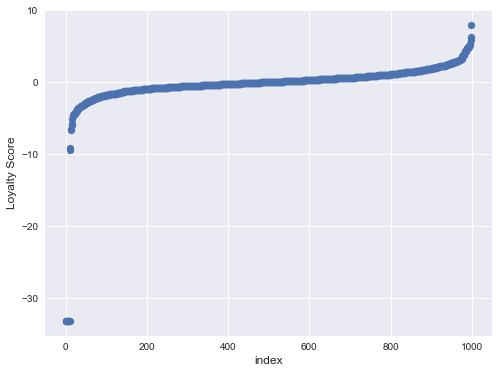

In [22]:
target_col = "loyalty_score"

plt.figure(figsize=(8,6))
plt.scatter(range(dftrain.shape[0]), np.sort(dftrain[target_col].values))
plt.xlabel('index', fontsize=12)
plt.ylabel('Loyalty Score', fontsize=12)
plt.show()

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



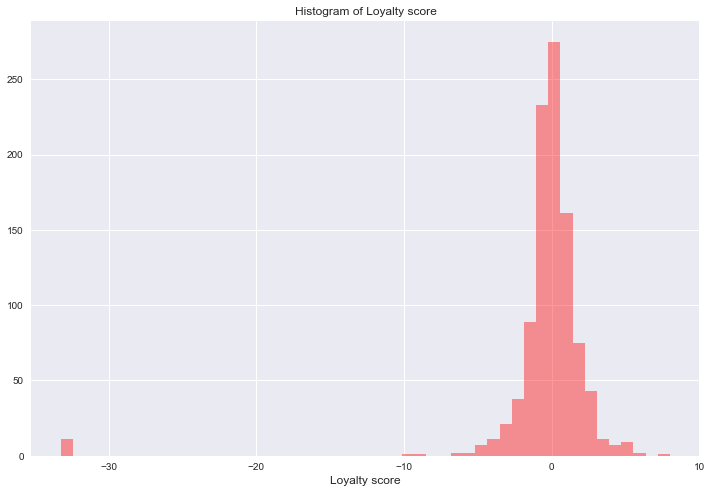

In [23]:
plt.figure(figsize=(12,8))
sns.distplot(dftrain[target_col].values, bins=50, kde=False, color="red")
plt.title("Histogram of Loyalty score")
plt.xlabel('Loyalty score', fontsize=12)
plt.show()

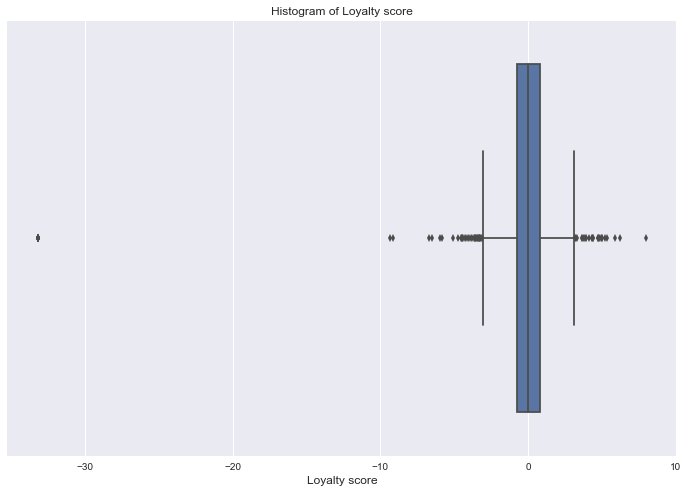

In [24]:
plt.figure(figsize=(12,8))
sns.boxplot(dftrain[target_col].values)
plt.title("Histogram of Loyalty score")
plt.xlabel('Loyalty score', fontsize=12)
plt.show()

In [25]:
(dftrain[target_col]<-30).sum()

11

In [2]:
dftrain = pd.read_csv('../RawData/train.csv')
dftest = pd.read_csv('../RawData/test.csv')
dfhist = pd.read_csv('../RawData/historical_transactions.csv')
dfnewm = pd.read_csv('../RawData/new_merchants.csv') 

In [27]:
trcopy = dftrain.copy()
tecopy = dftest.copy()

In [28]:
gdf = dfhist.groupby("card_id")
gdf = gdf["purchase_amount"].agg(['sum', 'mean', 'std', 'min', 'max']).reset_index()

In [29]:
gdf = dfhist.groupby("card_id")
gdf = gdf["purchase_amount"].size().reset_index()
gdf

,card_id,purchase_amount
0,C_ID_00370b000a,17
1,C_ID_003904d29f,15
2,C_ID_00892c8924,18
3,C_ID_00d285cf7e,103
4,C_ID_0108beb1a8,57
5,C_ID_01165a17a0,11
6,C_ID_0154533635,122
7,C_ID_0199a60015,30
8,C_ID_01a5f0c5f1,9
9,C_ID_01ab770cb7,24


In [30]:
trcopy = pd.merge(trcopy, dfhist, on="card_id", how="left")
tecopy = pd.merge(tecopy, dfhist, on="card_id", how="left")

<Figure size 1440x1440 with 0 Axes>

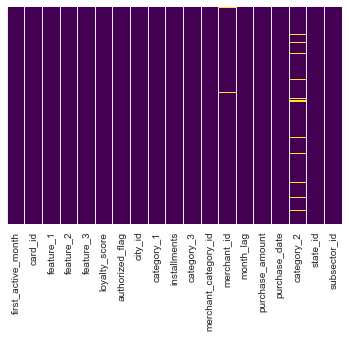

<Figure size 1440x1440 with 0 Axes>

In [31]:
## Missig Data heatmap

sns.heatmap(trcopy.isnull(),yticklabels=False,cbar=False,cmap='viridis')
sns.set(font_scale=1.30)
plt.figure(figsize=(20,20))

In [32]:
profile = pandas_profiling.ProfileReport(trcopy)
profile.to_file(outputfile="Trcopy_Pre_Profiling.html")

In [33]:
profile = pandas_profiling.ProfileReport(tecopy)
profile.to_file(outputfile="Tecopy_Pre_Profiling.html")

In [34]:
trcopy['first_active_month'].unique().sum()

'2017-042017-112017-102017-082016-072016-042017-052016-082017-092016-092014-042016-102017-012016-062017-022017-062017-032016-122015-042016-052015-082017-072014-092016-112014-052017-122016-032016-022015-122015-112015-052014-022016-012015-102014-072015-062015-012015-092013-082015-032014-082014-032014-062012-102014-112015-072013-092015-022013-122013-062014-10'

In [35]:
trcopy['first_active_month'].unique()

array(['2017-04', '2017-11', '2017-10', '2017-08', '2016-07', '2016-04',
       '2017-05', '2016-08', '2017-09', '2016-09', '2014-04', '2016-10',
       '2017-01', '2016-06', '2017-02', '2017-06', '2017-03', '2016-12',
       '2015-04', '2016-05', '2015-08', '2017-07', '2014-09', '2016-11',
       '2014-05', '2017-12', '2016-03', '2016-02', '2015-12', '2015-11',
       '2015-05', '2014-02', '2016-01', '2015-10', '2014-07', '2015-06',
       '2015-01', '2015-09', '2013-08', '2015-03', '2014-08', '2014-03',
       '2014-06', '2012-10', '2014-11', '2015-07', '2013-09', '2015-02',
       '2013-12', '2013-06', '2014-10'], dtype=object)

In [36]:
trcopy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89573 entries, 0 to 89572
Data columns (total 19 columns):
first_active_month      89573 non-null object
card_id                 89573 non-null object
feature_1               89573 non-null int64
feature_2               89573 non-null int64
feature_3               89573 non-null int64
loyalty_score           89573 non-null float64
authorized_flag         89573 non-null object
city_id                 89573 non-null int64
category_1              89573 non-null object
installments            89573 non-null int64
category_3              89042 non-null object
merchant_category_id    89573 non-null int64
merchant_id             89182 non-null object
month_lag               89573 non-null int64
purchase_amount         89573 non-null float64
purchase_date           89573 non-null object
category_2              81682 non-null float64
state_id                89573 non-null int64
subsector_id            89573 non-null int64
dtypes: float64(3), int

In [38]:
for df in [df_hist_trans,df_new_merchant_trans]:
    df['category_2'].fillna(1.0,inplace=True)
    df['category_3'].fillna('A',inplace=True)
    df['merchant_id'].fillna('M_ID_00a6ca8a8a',inplace=True)

NameError: name 'df_hist_trans' is not defined

In [39]:
dftrain['outliers'] = 0
dftrain.loc[dftrain['loyalty_score'] < -30, 'outliers'] = 1
dftrain['outliers'].value_counts()

0    989
1     11
Name: outliers, dtype: int64

In [40]:
dftrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 7 columns):
first_active_month    1000 non-null object
card_id               1000 non-null object
feature_1             1000 non-null int64
feature_2             1000 non-null int64
feature_3             1000 non-null int64
loyalty_score         1000 non-null float64
outliers              1000 non-null int64
dtypes: float64(1), int64(4), object(2)
memory usage: 54.8+ KB


In [41]:
dftrain.drop('outliers', axis=1, inplace = True)

In [42]:
dftrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 6 columns):
first_active_month    1000 non-null object
card_id               1000 non-null object
feature_1             1000 non-null int64
feature_2             1000 non-null int64
feature_3             1000 non-null int64
loyalty_score         1000 non-null float64
dtypes: float64(1), int64(3), object(2)
memory usage: 47.0+ KB


In [43]:
dftest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
first_active_month    200 non-null object
card_id               200 non-null object
feature_1             200 non-null int64
feature_2             200 non-null int64
feature_3             200 non-null int64
dtypes: int64(3), object(2)
memory usage: 7.9+ KB


In [44]:
dfhist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 14 columns):
authorized_flag         103617 non-null object
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              103617 non-null object
installments            103617 non-null int64
category_3              102970 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103159 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null object
category_2              94284 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 11.1+ MB


In [45]:
dfnewm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 14 columns):
authorized_flag         6740 non-null object
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null object
installments            6740 non-null int64
category_3              6528 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6651 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6390 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 737.3+ KB


In [46]:
newhis = pd.merge(dfhist, dfnewm, on="card_id", how="left").reset_index()
trcopy = pd.merge(newhis, dftrain, on="card_id", how="left").reset_index()

In [47]:
newhis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 746680 entries, 0 to 746679
Data columns (total 28 columns):
index                     746680 non-null int64
authorized_flag_x         746680 non-null object
card_id                   746680 non-null object
city_id_x                 746680 non-null int64
category_1_x              746680 non-null object
installments_x            746680 non-null int64
category_3_x              742682 non-null object
merchant_category_id_x    746680 non-null int64
merchant_id_x             742380 non-null object
month_lag_x               746680 non-null int64
purchase_amount_x         746680 non-null float64
purchase_date_x           746680 non-null object
category_2_x              695211 non-null float64
state_id_x                746680 non-null int64
subsector_id_x            746680 non-null int64
authorized_flag_y         727420 non-null object
city_id_y                 727420 non-null float64
category_1_y              727420 non-null object
installment

In [48]:
trcopy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 746680 entries, 0 to 746679
Data columns (total 34 columns):
level_0                   746680 non-null int64
index                     746680 non-null int64
authorized_flag_x         746680 non-null object
card_id                   746680 non-null object
city_id_x                 746680 non-null int64
category_1_x              746680 non-null object
installments_x            746680 non-null int64
category_3_x              742682 non-null object
merchant_category_id_x    746680 non-null int64
merchant_id_x             742380 non-null object
month_lag_x               746680 non-null int64
purchase_amount_x         746680 non-null float64
purchase_date_x           746680 non-null object
category_2_x              695211 non-null float64
state_id_x                746680 non-null int64
subsector_id_x            746680 non-null int64
authorized_flag_y         727420 non-null object
city_id_y                 727420 non-null float64
category_1_y

In [49]:
corr=trcopy.corr()["loyalty_score"]
corr[np.argsort(corr, axis=0)[::-1]]

loyalty_score             1.000000
category_2_x              0.046603
category_2_y              0.041130
month_lag_y               0.038066
feature_2                 0.036147
city_id_x                 0.021814
state_id_x                0.020629
installments_x            0.020462
subsector_id_x            0.007300
state_id_y                0.006792
subsector_id_y            0.002662
purchase_amount_x         0.002203
installments_y            0.000009
merchant_category_id_x   -0.005362
merchant_category_id_y   -0.007374
city_id_y                -0.011253
month_lag_x              -0.028771
purchase_amount_y        -0.037563
index                    -0.040258
level_0                  -0.040258
feature_3                -0.050371
feature_1                -0.066615
Name: loyalty_score, dtype: float64

In [50]:
correlations = trcopy.corr()# taking correlation into variable
attrs = correlations.iloc[:-1,:-1] # all except target

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()

unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), 
        columns=['Attribute Pair', 'Correlation'])

    # sorted by absolute value
unique_important_corrs = unique_important_corrs.iloc[
    abs(unique_important_corrs['Correlation']).argsort()[::-1]]

unique_important_corrs

,Attribute Pair,Correlation
0,"(category_2_x, category_2_y)",0.748503
1,"(feature_1, feature_3)",0.637234
2,"(state_id_x, state_id_y)",0.584791


In [51]:
trcopy.drop(['category_2_x', 'category_2_y', 'feature_1', 'feature_3', 'state_id_x', 'state_id_y'], axis=1, inplace=True)

In [52]:
trcopy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 746680 entries, 0 to 746679
Data columns (total 28 columns):
level_0                   746680 non-null int64
index                     746680 non-null int64
authorized_flag_x         746680 non-null object
card_id                   746680 non-null object
city_id_x                 746680 non-null int64
category_1_x              746680 non-null object
installments_x            746680 non-null int64
category_3_x              742682 non-null object
merchant_category_id_x    746680 non-null int64
merchant_id_x             742380 non-null object
month_lag_x               746680 non-null int64
purchase_amount_x         746680 non-null float64
purchase_date_x           746680 non-null object
subsector_id_x            746680 non-null int64
authorized_flag_y         727420 non-null object
city_id_y                 727420 non-null float64
category_1_y              727420 non-null object
installments_y            727420 non-null float64
category_3_

In [53]:
correlations = trcopy.corr()# taking correlation into variable
attrs = correlations.iloc[:-1,:-1] # all except target

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()

unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), 
        columns=['Attribute Pair', 'Correlation'])

    # sorted by absolute value
unique_important_corrs = unique_important_corrs.iloc[
    abs(unique_important_corrs['Correlation']).argsort()[::-1]]

unique_important_corrs

,Attribute Pair,Correlation


<Figure size 2000x2000 with 0 Axes>

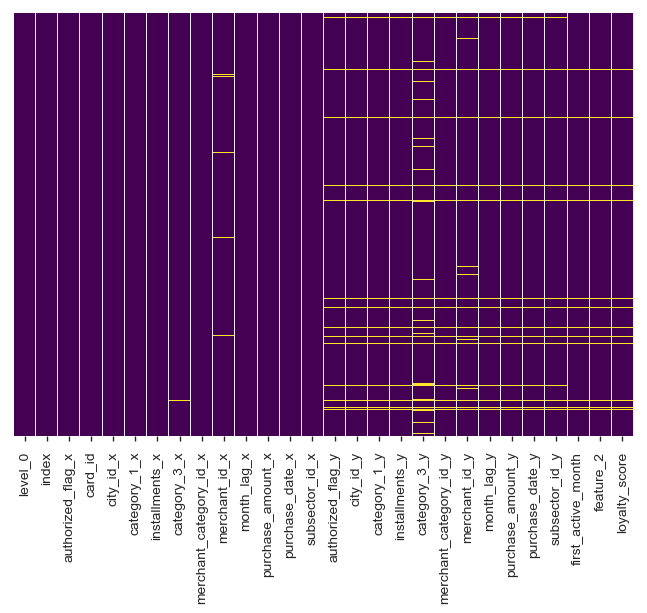

<Figure size 2000x2000 with 0 Axes>

In [54]:
## Missig Data heatmap

sns.heatmap(trcopy.isnull(),yticklabels=False,cbar=False,cmap='viridis')
sns.set(font_scale=1.30)
plt.figure(figsize=(20,20))

In [55]:
for df in [dfhist,dfnewm]:
    df['category_2'].fillna(1.0,inplace=True)
    df['category_3'].fillna('A',inplace=True)
    df['merchant_id'].fillna('M_ID_00a6ca8a8a',inplace=True)

In [56]:
dfhist.isnull().values.any()

False

In [57]:
dfnewm.isnull().values.any()

False

<Figure size 2000x2000 with 0 Axes>

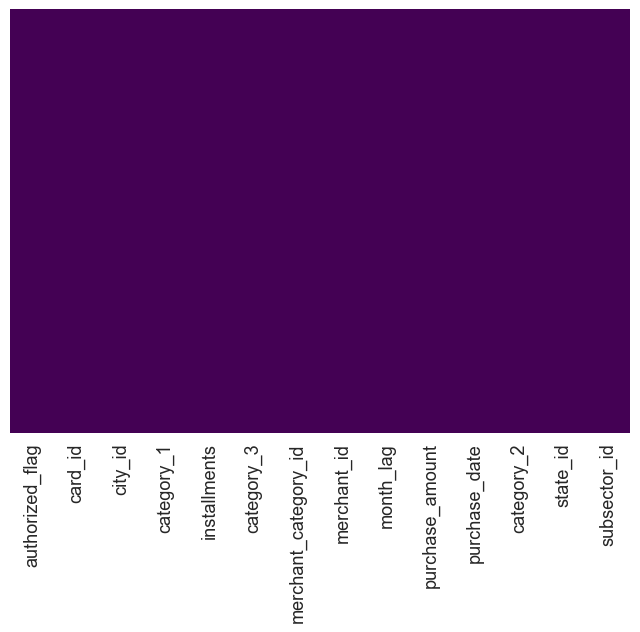

<Figure size 2000x2000 with 0 Axes>

In [58]:
## Missig Data heatmap

sns.heatmap(dfnewm.isnull(),yticklabels=False,cbar=False,cmap='viridis')
sns.set(font_scale=1.30)
plt.figure(figsize=(20,20))

In [59]:
newhis = pd.merge(dfhist, dfnewm, on="card_id", how="left").reset_index()
trcopy = pd.merge(newhis, dftrain, on="card_id", how="left").reset_index()

In [60]:
newhis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 746680 entries, 0 to 746679
Data columns (total 28 columns):
index                     746680 non-null int64
authorized_flag_x         746680 non-null object
card_id                   746680 non-null object
city_id_x                 746680 non-null int64
category_1_x              746680 non-null object
installments_x            746680 non-null int64
category_3_x              746680 non-null object
merchant_category_id_x    746680 non-null int64
merchant_id_x             746680 non-null object
month_lag_x               746680 non-null int64
purchase_amount_x         746680 non-null float64
purchase_date_x           746680 non-null object
category_2_x              746680 non-null float64
state_id_x                746680 non-null int64
subsector_id_x            746680 non-null int64
authorized_flag_y         727420 non-null object
city_id_y                 727420 non-null float64
category_1_y              727420 non-null object
installment

In [61]:
misvalcol = newhis.columns[newhis.isnull().any()]
newhis[misvalcol].describe()

,city_id_y,installments_y,merchant_category_id_y,month_lag_y,purchase_amount_y,category_2_y,state_id_y,subsector_id_y
count,727420.000000,727420.000000,727420.000000,727420.000000,727420.000000,727420.000000,727420.000000,727420.000000
mean,129.237106,0.539364,414.695448,1.486892,-0.580653,2.165206,11.574199,26.629529
std,102.669354,1.012608,238.395220,0.499828,0.454527,1.471233,6.349439,10.051298
min,-1.000000,-1.000000,2.000000,1.000000,-0.746893,1.000000,-1.000000,1.000000
25%,57.000000,0.000000,278.000000,1.000000,-0.716855,1.000000,9.000000,19.000000
50%,87.000000,0.000000,367.000000,1.000000,-0.682294,1.000000,9.000000,29.000000
75%,212.000000,1.000000,631.000000,2.000000,-0.596643,3.000000,16.000000,36.000000
max,344.000000,12.000000,891.000000,2.000000,9.382794,5.000000,24.000000,41.000000


In [111]:
test = newhis.columns[newhis.isnull().any()]

In [112]:
test

Index([], dtype='object')

In [65]:
[col for col in newhis.columns if newhis[col].isnull().any() if newhis[col].dtypes==object]

['authorized_flag_y',
 'category_1_y',
 'category_3_y',
 'merchant_id_y',
 'purchase_date_y']

In [66]:
profile = pandas_profiling.ProfileReport(newhis)
profile.to_file(outputfile="Newhis_Pre_Profiling.html")

In [67]:
df['category_2'].fillna(1.0,inplace=True)
df['category_3'].fillna('A',inplace=True)
df['merchant_id'].fillna('M_ID_00a6ca8a8a',inplace=True)

In [113]:
newhis = pd.merge(dfhist, dfnewm, on="card_id", how="inner").reset_index()

In [114]:
newhis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 727420 entries, 0 to 727419
Data columns (total 34 columns):
index                     727420 non-null int64
authorized_flag_x         727420 non-null object
card_id                   727420 non-null object
city_id_x                 727420 non-null int64
category_1_x              727420 non-null object
installments_x            727420 non-null int64
category_3                727420 non-null object
merchant_category_id_x    727420 non-null int64
merchant_id_x             727420 non-null object
month_lag_x               727420 non-null int64
purchase_amount_x         727420 non-null float64
purchase_date_x           727420 non-null object
category_2                727420 non-null float64
state_id_x                727420 non-null int64
subsector_id_x            727420 non-null int64
authorized_flag_y         727420 non-null int64
city_id_y                 727420 non-null int64
category_1_y              727420 non-null int64
installments_y 

In [116]:
newhis[['authorized_flag_x', 'authorized_flag_y']].head()

,authorized_flag_x,authorized_flag_y
0,Y,1
1,Y,1
2,Y,1
3,Y,1
4,Y,1


In [117]:
TrainDf = pd.merge(newhis, dftrain, on="card_id", how="inner").reset_index()

In [118]:
TrainDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 727420 entries, 0 to 727419
Data columns (total 40 columns):
level_0                   727420 non-null int64
index                     727420 non-null int64
authorized_flag_x         727420 non-null object
card_id                   727420 non-null object
city_id_x                 727420 non-null int64
category_1_x              727420 non-null object
installments_x            727420 non-null int64
category_3                727420 non-null object
merchant_category_id_x    727420 non-null int64
merchant_id_x             727420 non-null object
month_lag_x               727420 non-null int64
purchase_amount_x         727420 non-null float64
purchase_date_x           727420 non-null object
category_2                727420 non-null float64
state_id_x                727420 non-null int64
subsector_id_x            727420 non-null int64
authorized_flag_y         727420 non-null int64
city_id_y                 727420 non-null int64
category_1_y   

In [120]:
TrainDf.isnull().values.sum()

0

In [121]:
corr=TrainDf.corr()["loyalty_score"]
corr[np.argsort(corr, axis=0)[::-1]]

feature_3                -0.051473
purchase_amount_y        -0.037563
category_2_3.0           -0.028213
category_2_1.0           -0.045825
category_2                0.046138
feature_1                -0.070270
merchant_category_id_y   -0.007374
category_3_A             -0.025883
installments_x            0.022787
city_id_x                 0.022501
state_id_x                0.020051
purchase_date_y           0.172504
subsector_id_x            0.005751
state_id_y                0.006792
purchase_amount_x         0.002147
category_1_y             -0.014852
merchant_category_id_x   -0.003100
installments_y            0.000009
authorized_flag_y              NaN
city_id_y                -0.011253
category_2_4.0            0.086903
loyalty_score             1.000000
category_3_B              0.037280
category_2_5.0           -0.020941
category_2_2.0            0.050686
month_lag_x              -0.028737
month_lag_y               0.038066
index                    -0.040957
level_0             

In [132]:
Testdf = pd.merge(dftest, dftrain, on="card_id", how="right").reset_index()

In [133]:
Testdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
index                   1000 non-null int64
first_active_month_x    0 non-null object
card_id                 1000 non-null object
feature_1_x             0 non-null float64
feature_2_x             0 non-null float64
feature_3_x             0 non-null float64
first_active_month_y    1000 non-null object
feature_1_y             1000 non-null int64
feature_2_y             1000 non-null int64
feature_3_y             1000 non-null int64
loyalty_score           1000 non-null float64
dtypes: float64(4), int64(4), object(3)
memory usage: 86.0+ KB


In [134]:
dftrainer = pd.merge(dfhist, dftrain, on="card_id", how="inner").reset_index()

In [137]:
dftrainer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89573 entries, 0 to 89572
Data columns (total 20 columns):
index                   89573 non-null int64
authorized_flag         89573 non-null object
card_id                 89573 non-null object
city_id                 89573 non-null int64
category_1              89573 non-null object
installments            89573 non-null int64
category_3              89573 non-null object
merchant_category_id    89573 non-null int64
merchant_id             89573 non-null object
month_lag               89573 non-null int64
purchase_amount         89573 non-null float64
purchase_date           89573 non-null object
category_2              89573 non-null float64
state_id                89573 non-null int64
subsector_id            89573 non-null int64
first_active_month      89573 non-null object
feature_1               89573 non-null int64
feature_2               89573 non-null int64
feature_3               89573 non-null int64
loyalty_score           8

In [135]:
finaltrai = pd.merge(dftrainer, dfnewm, on="card_id", how="inner").reset_index()

In [136]:
finaltrai.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 727420 entries, 0 to 727419
Data columns (total 40 columns):
level_0                   727420 non-null int64
index                     727420 non-null int64
authorized_flag_x         727420 non-null object
card_id                   727420 non-null object
city_id_x                 727420 non-null int64
category_1_x              727420 non-null object
installments_x            727420 non-null int64
category_3                727420 non-null object
merchant_category_id_x    727420 non-null int64
merchant_id_x             727420 non-null object
month_lag_x               727420 non-null int64
purchase_amount_x         727420 non-null float64
purchase_date_x           727420 non-null object
category_2                727420 non-null float64
state_id_x                727420 non-null int64
subsector_id_x            727420 non-null int64
first_active_month        727420 non-null object
feature_1                 727420 non-null int64
feature_2     

In [74]:
gdf = dfhist.groupby("card_id")
gdf = gdf["purchase_amount"].size().reset_index()
gdf.columns = ["card_id", "num_hist_transactions"]
dftr = pd.merge(dftrain, gdf, on="card_id", how="left")
dfte = pd.merge(dftest, gdf, on="card_id", how="left")

In [75]:
dftr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 7 columns):
first_active_month       1000 non-null object
card_id                  1000 non-null object
feature_1                1000 non-null int64
feature_2                1000 non-null int64
feature_3                1000 non-null int64
loyalty_score            1000 non-null float64
num_hist_transactions    1000 non-null int64
dtypes: float64(1), int64(4), object(2)
memory usage: 62.5+ KB


In [76]:
corr=dftr.corr()["loyalty_score"]
corr[np.argsort(corr, axis=0)[::-1]]

loyalty_score            1.000000
num_hist_transactions    0.025724
feature_2               -0.009027
feature_1               -0.029475
feature_3               -0.044424
Name: loyalty_score, dtype: float64

In [77]:
test = TrainDf.columns[TrainDf.isnull().any()]
test

Index([], dtype='object')

In [78]:
TrainDf.isnull().values.any()

False

In [79]:
TrainDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 727420 entries, 0 to 727419
Data columns (total 34 columns):
level_0                   727420 non-null int64
index                     727420 non-null int64
authorized_flag_x         727420 non-null object
card_id                   727420 non-null object
city_id_x                 727420 non-null int64
category_1_x              727420 non-null object
installments_x            727420 non-null int64
category_3_x              727420 non-null object
merchant_category_id_x    727420 non-null int64
merchant_id_x             727420 non-null object
month_lag_x               727420 non-null int64
purchase_amount_x         727420 non-null float64
purchase_date_x           727420 non-null object
category_2_x              727420 non-null float64
state_id_x                727420 non-null int64
subsector_id_x            727420 non-null int64
authorized_flag_y         727420 non-null object
city_id_y                 727420 non-null int64
category_1_y  

In [80]:
TrainDf['loyalty_score'].isnull().values.any()

False

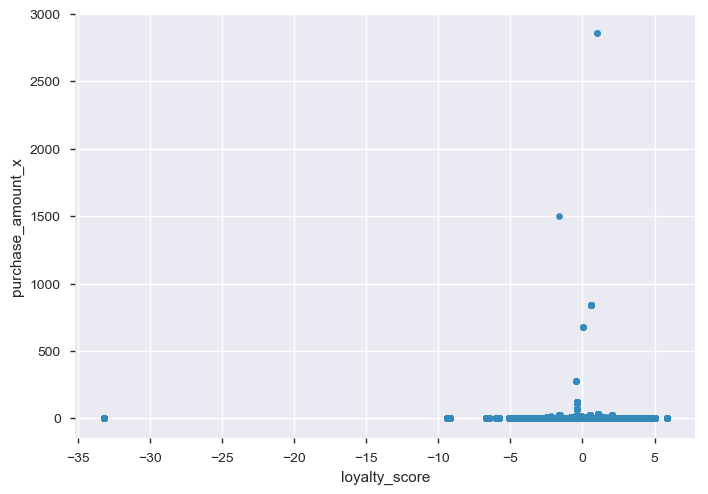

In [81]:
TrainDf.plot.scatter(x='loyalty_score',y='purchase_amount_x')

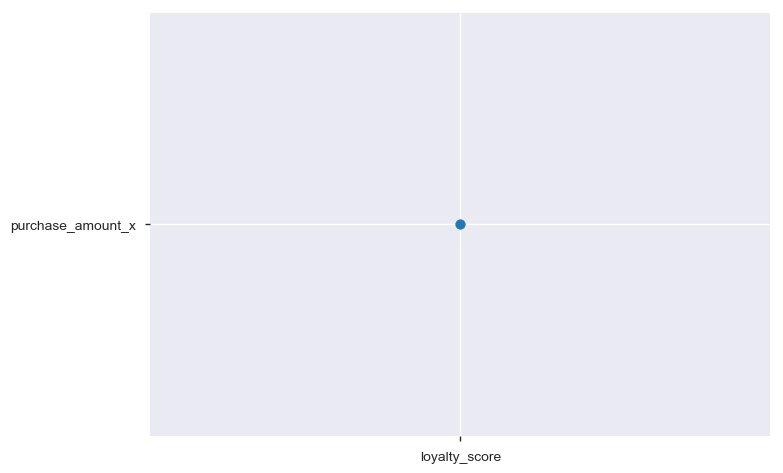

In [82]:
plt.scatter('loyalty_score', 'purchase_amount_x')

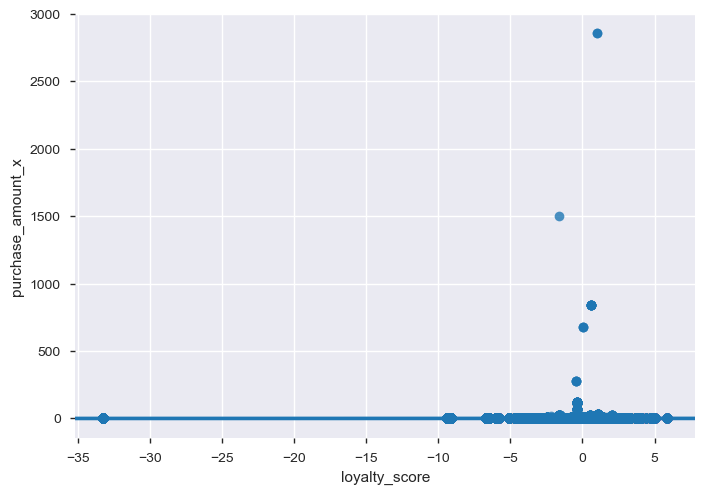

In [83]:
sns.regplot(x="loyalty_score", y="purchase_amount_x", data=TrainDf);
sns.set(font_scale=1.00)

In [84]:
corr=TrainDf.corr()["loyalty_score"]
corr[np.argsort(corr, axis=0)[::-1]]

loyalty_score             1.000000
category_2_x              0.046138
feature_2                 0.041756
month_lag_y               0.038066
category_2_y              0.036144
installments_x            0.022787
city_id_x                 0.022501
state_id_x                0.020051
state_id_y                0.006792
subsector_id_x            0.005751
subsector_id_y            0.002662
purchase_amount_x         0.002147
installments_y            0.000009
merchant_category_id_x   -0.003100
merchant_category_id_y   -0.007374
city_id_y                -0.011253
month_lag_x              -0.028737
purchase_amount_y        -0.037563
index                    -0.040957
level_0                  -0.040957
feature_3                -0.051473
feature_1                -0.070270
Name: loyalty_score, dtype: float64

In [85]:
TestDf = pd.merge(dftest, dfhist, on="card_id", how="inner").reset_index()

In [86]:
TestDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14044 entries, 0 to 14043
Data columns (total 19 columns):
index                   14044 non-null int64
first_active_month      14044 non-null object
card_id                 14044 non-null object
feature_1               14044 non-null int64
feature_2               14044 non-null int64
feature_3               14044 non-null int64
authorized_flag         14044 non-null object
city_id                 14044 non-null int64
category_1              14044 non-null object
installments            14044 non-null int64
category_3              14044 non-null object
merchant_category_id    14044 non-null int64
merchant_id             14044 non-null object
month_lag               14044 non-null int64
purchase_amount         14044 non-null float64
purchase_date           14044 non-null object
category_2              14044 non-null float64
state_id                14044 non-null int64
subsector_id            14044 non-null int64
dtypes: float64(2), int64

In [87]:
TrainDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 727420 entries, 0 to 727419
Data columns (total 34 columns):
level_0                   727420 non-null int64
index                     727420 non-null int64
authorized_flag_x         727420 non-null object
card_id                   727420 non-null object
city_id_x                 727420 non-null int64
category_1_x              727420 non-null object
installments_x            727420 non-null int64
category_3_x              727420 non-null object
merchant_category_id_x    727420 non-null int64
merchant_id_x             727420 non-null object
month_lag_x               727420 non-null int64
purchase_amount_x         727420 non-null float64
purchase_date_x           727420 non-null object
category_2_x              727420 non-null float64
state_id_x                727420 non-null int64
subsector_id_x            727420 non-null int64
authorized_flag_y         727420 non-null object
city_id_y                 727420 non-null int64
category_1_y  

In [88]:
trdata = pd.merge(dfhist, dftrain, on="card_id", how="inner", indicator=True).reset_index()

In [89]:
trdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89573 entries, 0 to 89572
Data columns (total 21 columns):
index                   89573 non-null int64
authorized_flag         89573 non-null object
card_id                 89573 non-null object
city_id                 89573 non-null int64
category_1              89573 non-null object
installments            89573 non-null int64
category_3              89573 non-null object
merchant_category_id    89573 non-null int64
merchant_id             89573 non-null object
month_lag               89573 non-null int64
purchase_amount         89573 non-null float64
purchase_date           89573 non-null object
category_2              89573 non-null float64
state_id                89573 non-null int64
subsector_id            89573 non-null int64
first_active_month      89573 non-null object
feature_1               89573 non-null int64
feature_2               89573 non-null int64
feature_3               89573 non-null int64
loyalty_score           8

In [90]:
trdata2 = pd.merge(dftrain, dfnewm, on="card_id", how="inner").reset_index()

In [91]:
trdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89573 entries, 0 to 89572
Data columns (total 21 columns):
index                   89573 non-null int64
authorized_flag         89573 non-null object
card_id                 89573 non-null object
city_id                 89573 non-null int64
category_1              89573 non-null object
installments            89573 non-null int64
category_3              89573 non-null object
merchant_category_id    89573 non-null int64
merchant_id             89573 non-null object
month_lag               89573 non-null int64
purchase_amount         89573 non-null float64
purchase_date           89573 non-null object
category_2              89573 non-null float64
state_id                89573 non-null int64
subsector_id            89573 non-null int64
first_active_month      89573 non-null object
feature_1               89573 non-null int64
feature_2               89573 non-null int64
feature_3               89573 non-null int64
loyalty_score           8

In [92]:
trdata2.head()

,index,first_active_month,card_id,feature_1,feature_2,feature_3,loyalty_score,authorized_flag,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,0,2017-04,C_ID_3c7fa72a88,3,3,1,1.463612,Y,-1,Y,1,B,544,M_ID_3111c6df35,1,-0.696975,2017-09-05 20:31:01,1.0,-1,29
1,1,2017-04,C_ID_3c7fa72a88,3,3,1,1.463612,Y,170,N,1,B,705,M_ID_bf334f7cca,2,-0.430600,2017-10-10 12:32:09,3.0,8,33
2,2,2017-11,C_ID_0e88908f2f,2,2,0,-0.086608,Y,246,N,0,A,703,M_ID_848ecd2e1a,2,-0.737892,2018-04-14 18:13:33,3.0,1,29
3,3,2017-11,C_ID_0e88908f2f,2,2,0,-0.086608,Y,246,N,0,A,63,M_ID_d205077bdf,1,-0.709342,2018-03-24 18:10:04,3.0,1,27
4,4,2017-11,C_ID_0e88908f2f,2,2,0,-0.086608,Y,246,N,0,A,278,M_ID_7b932a8c40,1,-0.624442,2018-03-26 15:47:17,3.0,1,37


In [93]:
trdata2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6003 entries, 0 to 6002
Data columns (total 20 columns):
index                   6003 non-null int64
first_active_month      6003 non-null object
card_id                 6003 non-null object
feature_1               6003 non-null int64
feature_2               6003 non-null int64
feature_3               6003 non-null int64
loyalty_score           6003 non-null float64
authorized_flag         6003 non-null object
city_id                 6003 non-null int64
category_1              6003 non-null object
installments            6003 non-null int64
category_3              6003 non-null object
merchant_category_id    6003 non-null int64
merchant_id             6003 non-null object
month_lag               6003 non-null int64
purchase_amount         6003 non-null float64
purchase_date           6003 non-null object
category_2              6003 non-null float64
state_id                6003 non-null int64
subsector_id            6003 non-null int64


In [109]:
dftest.head()

,first_active_month,card_id,feature_1,feature_2,feature_3
0,2017-07,C_ID_2705885163,2,1,0
1,2016-06,C_ID_096b6fa30d,2,2,0
2,2016-12,C_ID_3e1c208f74,1,3,0
3,2017-09,C_ID_23995c6879,5,1,1
4,2017-01,C_ID_7d0553395a,4,2,0


In [110]:
dfnewm.head()

,authorized_flag,card_id,city_id,category_1,installments,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,state_id,subsector_id,category_2_1.0,category_2_2.0,category_2_3.0,category_2_4.0,category_2_5.0,category_3_A,category_3_B,category_3_C
0,1,C_ID_89f5a36cc3,69,0,2,879,M_ID_00a6ca8a8a,1,-0.446378,1.498757e+09,9,29,1,0,0,0,0,0,0,1
1,1,C_ID_89f5a36cc3,231,0,1,108,M_ID_e6570d8726,1,-0.634509,1.497961e+09,9,34,1,0,0,0,0,0,1,0
2,1,C_ID_89f5a36cc3,69,0,1,273,M_ID_32d73b8ecf,2,-0.626696,1.500560e+09,9,20,1,0,0,0,0,0,1,0
3,1,C_ID_89f5a36cc3,69,0,1,80,M_ID_c03b62d83d,2,-0.677786,1.500560e+09,9,37,1,0,0,0,0,0,1,0
4,1,C_ID_6a9d23ccea,261,0,0,437,M_ID_d179007279,1,-0.620460,1.522089e+09,9,15,1,0,0,0,0,1,0,0


In [106]:
tedata = pd.merge(dftest, dfnewm, on="card_id", how="left").reset_index()

In [107]:
tedata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 25 columns):
index                   200 non-null int64
first_active_month      200 non-null object
card_id                 200 non-null object
feature_1               200 non-null int64
feature_2               200 non-null int64
feature_3               200 non-null int64
authorized_flag         0 non-null float64
city_id                 0 non-null float64
category_1              0 non-null float64
installments            0 non-null float64
merchant_category_id    0 non-null float64
merchant_id             0 non-null object
month_lag               0 non-null float64
purchase_amount         0 non-null float64
purchase_date           0 non-null float64
state_id                0 non-null float64
subsector_id            0 non-null float64
category_2_1.0          0 non-null float64
category_2_2.0          0 non-null float64
category_2_3.0          0 non-null float64
category_2_4.0          0 non-null

In [108]:
tedata.head()

,index,first_active_month,card_id,feature_1,feature_2,feature_3,authorized_flag,city_id,category_1,installments,...,state_id,subsector_id,category_2_1.0,category_2_2.0,category_2_3.0,category_2_4.0,category_2_5.0,category_3_A,category_3_B,category_3_C
0,0,2017-07,C_ID_2705885163,2,1,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2016-06,C_ID_096b6fa30d,2,2,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2016-12,C_ID_3e1c208f74,1,3,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2017-09,C_ID_23995c6879,5,1,1,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2017-01,C_ID_7d0553395a,4,2,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [96]:
dfnewm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 14 columns):
authorized_flag         6740 non-null object
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null object
installments            6740 non-null int64
category_3              6740 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6740 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6740 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 737.3+ KB


In [97]:
dfhist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 14 columns):
authorized_flag         103617 non-null object
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              103617 non-null object
installments            103617 non-null int64
category_3              103617 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103617 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null object
category_2              103617 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 11.1+ MB


In [98]:
dfnewm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 14 columns):
authorized_flag         6740 non-null object
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null object
installments            6740 non-null int64
category_3              6740 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6740 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6740 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 737.3+ KB


In [99]:
dfnewm = pd.get_dummies(dfnewm, columns=['category_2', 'category_3'])
dfnewm['authorized_flag'] = dfnewm['authorized_flag'].map({'Y': 1, 'N': 0})
dfnewm['category_1'] = dfnewm['category_1'].map({'Y': 1, 'N': 0})
dfnewm.head()

,authorized_flag,card_id,city_id,category_1,installments,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,state_id,subsector_id,category_2_1.0,category_2_2.0,category_2_3.0,category_2_4.0,category_2_5.0,category_3_A,category_3_B,category_3_C
0,1,C_ID_89f5a36cc3,69,0,2,879,M_ID_00a6ca8a8a,1,-0.446378,2017-06-29 17:16:52,9,29,1,0,0,0,0,0,0,1
1,1,C_ID_89f5a36cc3,231,0,1,108,M_ID_e6570d8726,1,-0.634509,2017-06-20 12:15:31,9,34,1,0,0,0,0,0,1,0
2,1,C_ID_89f5a36cc3,69,0,1,273,M_ID_32d73b8ecf,2,-0.626696,2017-07-20 14:21:23,9,20,1,0,0,0,0,0,1,0
3,1,C_ID_89f5a36cc3,69,0,1,80,M_ID_c03b62d83d,2,-0.677786,2017-07-20 14:05:10,9,37,1,0,0,0,0,0,1,0
4,1,C_ID_6a9d23ccea,261,0,0,437,M_ID_d179007279,1,-0.620460,2018-03-26 18:35:19,9,15,1,0,0,0,0,1,0,0


In [100]:
def aggregate_transactions(trans, prefix):  
    trans.loc[:, 'purchase_date'] = pd.DatetimeIndex(trans['purchase_date']).\
                                      astype(np.int64) * 1e-9
    
    agg_func = {
        'authorized_flag': ['sum', 'mean'],
        'category_1': ['mean'],
        'category_2_1.0': ['mean'],
        'category_2_2.0': ['mean'],
        'category_2_3.0': ['mean'],
        'category_2_4.0': ['mean'],
        'category_2_5.0': ['mean'],
        'category_3_A': ['mean'],
        'category_3_B': ['mean'],
        'category_3_C': ['mean'],
        'merchant_id': ['nunique'],
        'purchase_amount': ['sum', 'mean', 'max', 'min', 'std'],
        'installments': ['sum', 'mean', 'max', 'min', 'std'],
        'purchase_date': [np.ptp],
        'month_lag': ['min', 'max']
    }
    agg_trans = trans.groupby(['card_id']).agg(agg_func)
    agg_trans.columns = [prefix + '_'.join(col).strip() 
                           for col in agg_trans.columns.values]
    agg_trans.reset_index(inplace=True)
    
    df = (trans.groupby('card_id')
          .size()
          .reset_index(name='{}transactions_count'.format(prefix)))
    
    agg_trans = pd.merge(df, agg_trans, on='card_id', how='left')
    
    return agg_trans

In [101]:
newmer = aggregate_transactions(dfnewm, prefix='hist_')
train = pd.merge(dftrain, newmer, on='card_id',how='left')
test = pd.merge(dftest, newmer, on='card_id',how='left')
#shape of data
print('train shape', train.shape)
print('test shape', test.shape)

train shape (1000, 32)
test shape (200, 31)


In [102]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 32 columns):
first_active_month           1000 non-null object
card_id                      1000 non-null object
feature_1                    1000 non-null int64
feature_2                    1000 non-null int64
feature_3                    1000 non-null int64
loyalty_score                1000 non-null float64
hist_transactions_count      897 non-null float64
hist_authorized_flag_sum     897 non-null float64
hist_authorized_flag_mean    897 non-null float64
hist_category_1_mean         897 non-null float64
hist_category_2_1.0_mean     897 non-null float64
hist_category_2_2.0_mean     897 non-null float64
hist_category_2_3.0_mean     897 non-null float64
hist_category_2_4.0_mean     897 non-null float64
hist_category_2_5.0_mean     897 non-null float64
hist_category_3_A_mean       897 non-null float64
hist_category_3_B_mean       897 non-null float64
hist_category_3_C_mean       897 non-null floa

In [104]:
corr=train.corr()["loyalty_score"]
corr[np.argsort(corr, axis=0)[::-1]]

loyalty_score                1.000000
hist_category_2_3.0_mean    -0.045774
hist_category_3_A_mean      -0.020304
hist_purchase_date_ptp      -0.010713
hist_month_lag_min           0.024168
hist_category_2_1.0_mean     0.004610
hist_merchant_id_nunique    -0.032078
hist_category_1_mean        -0.015176
hist_installments_max       -0.019532
hist_installments_sum       -0.017975
feature_2                   -0.009027
hist_installments_std       -0.021796
hist_purchase_amount_max    -0.053741
hist_category_3_B_mean       0.030149
hist_authorized_flag_mean         NaN
hist_purchase_amount_std    -0.065873
hist_installments_mean      -0.001942
hist_category_2_5.0_mean    -0.030289
hist_installments_min        0.002886
feature_1                   -0.029475
hist_category_2_4.0_mean     0.075311
hist_category_3_C_mean      -0.014341
hist_authorized_flag_sum    -0.032192
hist_month_lag_max           0.023537
hist_transactions_count     -0.032192
hist_purchase_amount_sum     0.016244
feature_3   

In [105]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 0 to 199
Data columns (total 31 columns):
first_active_month           200 non-null object
card_id                      200 non-null object
feature_1                    200 non-null int64
feature_2                    200 non-null int64
feature_3                    200 non-null int64
hist_transactions_count      0 non-null float64
hist_authorized_flag_sum     0 non-null float64
hist_authorized_flag_mean    0 non-null float64
hist_category_1_mean         0 non-null float64
hist_category_2_1.0_mean     0 non-null float64
hist_category_2_2.0_mean     0 non-null float64
hist_category_2_3.0_mean     0 non-null float64
hist_category_2_4.0_mean     0 non-null float64
hist_category_2_5.0_mean     0 non-null float64
hist_category_3_A_mean       0 non-null float64
hist_category_3_B_mean       0 non-null float64
hist_category_3_C_mean       0 non-null float64
hist_merchant_id_nunique     0 non-null float64
hist_purchase_amount_sum     

In [140]:
dfnewm = pd.read_csv('../RawData/new_merchants.csv') 

In [142]:
# Convert category values
def category_convert(data):
    data['cat2'] = data['category_2']
    data['cat3'] = data['category_3']
    data = pd.get_dummies(data, columns=['cat2', 'cat3'])
    for bi_cat in ['authorized_flag', 'category_1']:
        data[bi_cat] = data[bi_cat].map({'Y':1, 'N':0})
    return data

dfnewm = category_convert(dfnewm)

In [143]:
# historical_transactions & new merchants transaction
# categorical data and other general data
def aggregate_trans(data, prefix):  
    agg_func = {
        'card_id': ['size'], #num_trans
        'authorized_flag': ['sum', 'mean','nunique'],
        'category_1': ['sum', 'mean','nunique'],
        'category_2': ['nunique'],
        'category_3': ['nunique'],
        'cat2_1.0': ['mean'],
        'cat2_2.0': ['mean'],
        'cat2_3.0': ['mean'],
        'cat2_4.0': ['mean'],
        'cat2_5.0': ['mean'],
        'cat3_A': ['mean'],
        'cat3_B': ['mean'],
        'cat3_C': ['mean'],
        'city_id': ['nunique'],
        'state_id': ['nunique'],
        'subsector_id': ['nunique'],
        'installments': ['sum', 'mean','median', 'max', 'min', 'std', 'nunique'],
        'merchant_id': ['nunique'],
        'merchant_category_id': ['nunique'],
        'month_lag': ['mean', 'max', 'min', 'std', 'nunique'],
        'purchase_amount': ['sum', 'mean', 'max', 'min', 'std', 'nunique']
    }    
    agg_trans = data.groupby(['card_id']).agg(agg_func)
    agg_trans.columns = [prefix + '_'.join(col).strip() for col in agg_trans.columns.values]
    agg_trans.reset_index(inplace=True)
    
    return agg_trans

dfnewmagr = aggregate_trans(dfnewm, 'new_')

In [144]:
dfnewm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 22 columns):
authorized_flag         6740 non-null int64
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null int64
installments            6740 non-null int64
category_3              6528 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6651 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6390 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
cat2_1.0                6740 non-null uint8
cat2_2.0                6740 non-null uint8
cat2_3.0                6740 non-null uint8
cat2_4.0                6740 non-null uint8
cat2_5.0                6740 non-null uint8
cat3_A                  6740 non-null uint8
cat3_

In [165]:
TrainDf = pd.merge(dftrain, dfhist, on="card_id", how="inner").reset_index()

In [166]:
TrainDf = pd.merge(dfnewm, TrainDf, on="card_id", how="left").reset_index()

In [167]:
TrainDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 728157 entries, 0 to 728156
Data columns (total 42 columns):
level_0                   728157 non-null int64
authorized_flag_x         728157 non-null int64
card_id                   728157 non-null object
city_id_x                 728157 non-null int64
category_1_x              728157 non-null int64
installments_x            728157 non-null int64
category_3_x              710275 non-null object
merchant_category_id_x    728157 non-null int64
merchant_id_x             720067 non-null object
month_lag_x               728157 non-null int64
purchase_amount_x         728157 non-null float64
purchase_date_x           728157 non-null object
category_2_x              696895 non-null float64
state_id_x                728157 non-null int64
subsector_id_x            728157 non-null int64
cat2_1.0                  728157 non-null uint8
cat2_2.0                  728157 non-null uint8
cat2_3.0                  728157 non-null uint8
cat2_4.0         

In [183]:
TestDf = pd.merge(dftest, dfhist, on="card_id", how="inner").reset_index()

In [181]:
TestDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14044 entries, 0 to 14043
Data columns (total 19 columns):
index                   14044 non-null int64
first_active_month      14044 non-null object
card_id                 14044 non-null object
feature_1               14044 non-null int64
feature_2               14044 non-null int64
feature_3               14044 non-null int64
authorized_flag         14044 non-null object
city_id                 14044 non-null int64
category_1              14044 non-null object
installments            14044 non-null int64
category_3              14044 non-null object
merchant_category_id    14044 non-null int64
merchant_id             14044 non-null object
month_lag               14044 non-null int64
purchase_amount         14044 non-null float64
purchase_date           14044 non-null object
category_2              14044 non-null float64
state_id                14044 non-null int64
subsector_id            14044 non-null int64
dtypes: float64(2), int64

In [182]:
dftest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
first_active_month    200 non-null object
card_id               200 non-null object
feature_1             200 non-null int64
feature_2             200 non-null int64
feature_3             200 non-null int64
dtypes: int64(3), object(2)
memory usage: 7.9+ KB


In [185]:
import datetime
import time
import sys

In [196]:
train = pd.read_csv("../RawData/train.csv")
test = pd.read_csv("../RawData/test.csv")
histdata = pd.read_csv("../RawData/historical_transactions.csv")
newdata = pd.read_csv('../RawData/new_merchants.csv') 

In [197]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 6 columns):
first_active_month    1000 non-null object
card_id               1000 non-null object
feature_1             1000 non-null int64
feature_2             1000 non-null int64
feature_3             1000 non-null int64
loyalty_score         1000 non-null float64
dtypes: float64(1), int64(3), object(2)
memory usage: 47.0+ KB


In [198]:
# train & test data
# extract target value
target = train['loyalty_score']

# Convert time as features
for data in [train,test]:
    data['first_active_month'] = pd.to_datetime(data['first_active_month'])
    data['year'] = data['first_active_month'].dt.year
    data['month'] = data['first_active_month'].dt.month
    data['howlong'] = (datetime.date(2019,4,1) - data['first_active_month'].dt.date).dt.days

train = train.drop(['first_active_month','loyalty_score'], axis=1)
test = test.drop(['first_active_month'], axis=1)

In [199]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 7 columns):
card_id      1000 non-null object
feature_1    1000 non-null int64
feature_2    1000 non-null int64
feature_3    1000 non-null int64
year         1000 non-null int64
month        1000 non-null int64
howlong      1000 non-null int64
dtypes: int64(6), object(1)
memory usage: 54.8+ KB


In [200]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 7 columns):
card_id      200 non-null object
feature_1    200 non-null int64
feature_2    200 non-null int64
feature_3    200 non-null int64
year         200 non-null int64
month        200 non-null int64
howlong      200 non-null int64
dtypes: int64(6), object(1)
memory usage: 11.0+ KB


In [201]:
# Convert category values
def category_convert(data):
    data['cat2'] = data['category_2']
    data['cat3'] = data['category_3']
    data = pd.get_dummies(data, columns=['cat2', 'cat3'])
    for bi_cat in ['authorized_flag', 'category_1']:
        data[bi_cat] = data[bi_cat].map({'Y':1, 'N':0})
    return data

histdata = category_convert(histdata)
newdata = category_convert(newdata)

In [202]:
histdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 22 columns):
authorized_flag         103617 non-null int64
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              103617 non-null int64
installments            103617 non-null int64
category_3              102970 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103159 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null object
category_2              94284 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
cat2_1.0                103617 non-null uint8
cat2_2.0                103617 non-null uint8
cat2_3.0                103617 non-null uint8
cat2_4.0                103617 non-null uint8
cat2_5.0                103617 non-null uint8
cat3_A  

In [203]:
newdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 22 columns):
authorized_flag         6740 non-null int64
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null int64
installments            6740 non-null int64
category_3              6528 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6651 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6390 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
cat2_1.0                6740 non-null uint8
cat2_2.0                6740 non-null uint8
cat2_3.0                6740 non-null uint8
cat2_4.0                6740 non-null uint8
cat2_5.0                6740 non-null uint8
cat3_A                  6740 non-null uint8
cat3_

In [204]:
# historical_transactions & new merchants transaction
# categorical data and other general data
def aggregate_trans(data, prefix):  
    agg_func = {
        'card_id': ['size'], #num_trans
        'authorized_flag': ['sum', 'mean','nunique'],
        'category_1': ['sum', 'mean','nunique'],
        'category_2': ['nunique'],
        'category_3': ['nunique'],
        'cat2_1.0': ['mean'],
        'cat2_2.0': ['mean'],
        'cat2_3.0': ['mean'],
        'cat2_4.0': ['mean'],
        'cat2_5.0': ['mean'],
        'cat3_A': ['mean'],
        'cat3_B': ['mean'],
        'cat3_C': ['mean'],
        'city_id': ['nunique'],
        'state_id': ['nunique'],
        'subsector_id': ['nunique'],
        'installments': ['sum', 'mean','median', 'max', 'min', 'std', 'nunique'],
        'merchant_id': ['nunique'],
        'merchant_category_id': ['nunique'],
        'month_lag': ['mean', 'max', 'min', 'std', 'nunique'],
        'purchase_amount': ['sum', 'mean', 'max', 'min', 'std', 'nunique']
    }    
    agg_trans = data.groupby(['card_id']).agg(agg_func)
    agg_trans.columns = [prefix + '_'.join(col).strip() for col in agg_trans.columns.values]
    agg_trans.reset_index(inplace=True)
    
    return agg_trans

hist_sum = aggregate_trans(histdata, 'hist_')
new_sum = aggregate_trans(newdata, 'new_')

In [205]:
hist_sum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 41 columns):
card_id                              1200 non-null object
hist_card_id_size                    1200 non-null int64
hist_authorized_flag_sum             1200 non-null int64
hist_authorized_flag_mean            1200 non-null float64
hist_authorized_flag_nunique         1200 non-null int64
hist_category_1_sum                  1200 non-null int64
hist_category_1_mean                 1200 non-null float64
hist_category_1_nunique              1200 non-null int64
hist_category_2_nunique              1200 non-null int64
hist_category_3_nunique              1200 non-null int64
hist_cat2_1.0_mean                   1200 non-null float64
hist_cat2_2.0_mean                   1200 non-null float64
hist_cat2_3.0_mean                   1200 non-null float64
hist_cat2_4.0_mean                   1200 non-null float64
hist_cat2_5.0_mean                   1200 non-null float64
hist_cat3_A_mean       

In [206]:
new_sum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 41 columns):
card_id                             1000 non-null object
new_card_id_size                    1000 non-null int64
new_authorized_flag_sum             1000 non-null int64
new_authorized_flag_mean            1000 non-null int64
new_authorized_flag_nunique         1000 non-null int64
new_category_1_sum                  1000 non-null int64
new_category_1_mean                 1000 non-null float64
new_category_1_nunique              1000 non-null int64
new_category_2_nunique              1000 non-null int64
new_category_3_nunique              1000 non-null int64
new_cat2_1.0_mean                   1000 non-null float64
new_cat2_2.0_mean                   1000 non-null float64
new_cat2_3.0_mean                   1000 non-null float64
new_cat2_4.0_mean                   1000 non-null float64
new_cat2_5.0_mean                   1000 non-null float64
new_cat3_A_mean                     1000 

In [207]:
# Devide time 
# Code from: Chau Ngoc Huynh - "My first kernel (3.699)"

def devide_time(data):
    data['purchase_date'] = pd.to_datetime(data['purchase_date'])
    data['month_diff'] = ((datetime.datetime.today() - data['purchase_date']).dt.days)//30  
    data['purchase_year'] = data['purchase_date'].dt.year
    data['purchase_month'] = data['purchase_date'].dt.month
    data['weekofyear'] = data['purchase_date'].dt.weekofyear
    data['dayofweek'] = data['purchase_date'].dt.dayofweek
    data['weekend'] = (data.purchase_date.dt.weekday >=5).astype(int)
    data['hour'] = data['purchase_date'].dt.hour
    return data

hist_times = devide_time(histdata)
new_times = devide_time(newdata)

In [208]:
def aggregate_times(data, prefix):  
#     data.loc[:, 'purchase_date'] = pd.DatetimeIndex(data['purchase_date']).astype(np.int64) * 1e-9

    agg_func = {
#         'purchase_date': [np.ptp, 'min', 'max','nunique'],  #np.ptp=pur_term
        'month_diff': ['mean','max','min'],
        'purchase_year': ['mean', 'max', 'min', 'std','nunique'],
        'purchase_month': ['mean', 'max', 'min', 'std','nunique'],
        'weekofyear': ['mean','max','min','nunique'],
        'dayofweek': ['mean'],
        'weekend': ['sum', 'mean'],
        'hour': ['mean','max','min']
    }    
    agg_times = data.groupby(['card_id']).agg(agg_func)
    agg_times.columns = [prefix + '_'.join(col).strip() 
                           for col in agg_times.columns.values]
    agg_times.reset_index(inplace=True)
    
    return agg_times

hist_times = aggregate_times(hist_times, 'hist_')
new_times = aggregate_times(new_times, 'new_')

In [209]:
# purchase date term
histdata['pur_date'] = pd.DatetimeIndex(histdata['purchase_date']).date
newdata['pur_date'] = pd.DatetimeIndex(newdata['purchase_date']).date

histdata.loc[:,'pur_date'] = pd.DatetimeIndex(histdata['pur_date']).astype(np.int64) * 1e-9
newdata.loc[:,'pur_date'] = pd.DatetimeIndex(newdata['pur_date']).astype(np.int64) * 1e-9

agg_fn= {
        'pur_date': [np.ptp,'max','min'], # np.ptp: Range of values (maximum - minimum) 
        }
agg_hist = histdata.groupby(['card_id']).agg(agg_fn)
agg_hist.columns = ['_'.join(col).strip() for col in agg_hist.columns.values]
agg_hist.reset_index(inplace=True)

agg_new = newdata.groupby(['card_id']).agg(agg_fn)
agg_new.columns = ['_'.join(col).strip() for col in agg_new.columns.values]
agg_new.reset_index(inplace=True)

agg_hist.columns = ['hist_' + c if c != 'card_id' else c for c in agg_hist.columns]
agg_new.columns = ['new_' + c if c != 'card_id' else c for c in agg_new.columns]

# scale agg_hist, agg_new
import sklearn as sk
from sklearn import preprocessing

agg_hist['hist_pur_date_ptp']=sk.preprocessing.scale(agg_hist['hist_pur_date_ptp'])
agg_new['new_pur_date_ptp']=sk.preprocessing.scale(agg_new['new_pur_date_ptp'])
agg_hist['hist_pur_date_max']=sk.preprocessing.scale(agg_hist['hist_pur_date_max'])
agg_new['new_pur_date_max']=sk.preprocessing.scale(agg_new['new_pur_date_max'])
agg_hist['hist_pur_date_min']=sk.preprocessing.scale(agg_hist['hist_pur_date_min'])
agg_new['new_pur_date_min']=sk.preprocessing.scale(agg_new['new_pur_date_min'])

C:\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:164: UserWarning:

Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.

C:\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:164: UserWarning:

Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.



In [210]:
# merge 
hist = hist_times.merge(hist_sum,on='card_id',how='left')
hist = hist.merge(agg_hist, on='card_id',how='left')
del hist_sum
del hist_times
del agg_hist

new = new_times.merge(new_sum, on='card_id',how='left')
new = new.merge(agg_new, on='card_id',how='left')
del new_sum
del new_times
del agg_new

In [211]:
train = train.merge(hist, on='card_id',how='left')
train = train.merge(new, on='card_id',how='left')

test = test.merge(hist, on='card_id',how='left')
test = test.merge(new, on='card_id',how='left')

train.head()

,card_id,feature_1,feature_2,feature_3,year,month,howlong,hist_month_diff_mean,hist_month_diff_max,hist_month_diff_min,...,new_month_lag_nunique,new_purchase_amount_sum,new_purchase_amount_mean,new_purchase_amount_max,new_purchase_amount_min,new_purchase_amount_std,new_purchase_amount_nunique,new_pur_date_ptp,new_pur_date_max,new_pur_date_min
0,C_ID_3c7fa72a88,3,3,1,2017,4,730,20.444444,24,19,...,2.0,-1.127574,-0.563787,-0.430600,-0.696975,0.188356,2.0,0.271101,-2.316483,-2.395570
1,C_ID_0e88908f2f,2,2,0,2017,11,516,14.403226,16,13,...,2.0,-7.888363,-0.657364,-0.521510,-0.737892,0.076641,11.0,0.992525,0.503221,0.219004
2,C_ID_f0c9288c95,3,1,1,2017,10,547,15.833333,17,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,C_ID_cd14e3a35a,3,1,1,2017,8,608,16.157895,19,13,...,2.0,-0.900419,-0.450209,-0.178906,-0.721513,0.383681,2.0,0.374162,0.370356,0.263319
4,C_ID_4d0a9b9fdb,5,2,1,2017,10,547,13.843750,17,13,...,2.0,-7.092994,-0.545615,-0.073720,-0.721363,0.168696,13.0,1.250177,0.591798,0.233775


In [212]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Columns: 139 entries, card_id to new_pur_date_min
dtypes: float64(98), int32(1), int64(39), object(1)
memory usage: 1.1+ MB


In [213]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 0 to 199
Columns: 139 entries, card_id to new_pur_date_min
dtypes: float64(98), int32(1), int64(39), object(1)
memory usage: 218.0+ KB


In [215]:
from sklearn.preprocessing import LabelEncoder,OneHotEncoder

labelEnc=LabelEncoder()

myObjlist = []
myObjlist = train.columns[train.dtypes==object]

for col in myObjlist:
    train[col]=labelEnc.fit_transform(train[col])

In [220]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Columns: 139 entries, card_id to new_pur_date_min
dtypes: float64(98), int32(1), int64(40)
memory usage: 1.1 MB


In [224]:
train.isna().values.sum()

7453

In [218]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(random_state=1, max_depth=10)
model.fit(train,target)

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

In [ ]:
features = df.columns
importances = model.feature_importances_
indices = np.argsort(importances)[-9:]  # top 10 features
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
train['Item_Weight'].fillna(train['Item_Weight'].median(), inplace=True)
train['Outlet_Size'].fillna(train['Outlet_Size'].mode()[0], inplace=True)

In [225]:
outliers=[]
def detect_outlier(data_1):
    
    threshold=3
    mean_1 = np.mean(data_1)
    std_1 =np.std(data_1)
    
    
    for y in data_1:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold:
            outliers.append(y)
    return outliers

In [226]:
result = detect_outlier(TestDf)
print(result)

TypeError: ufunc 'subtract' did not contain a loop with signature matching types dtype('<U32') dtype('<U32') dtype('<U32')

In [ ]:
from sklearn.ensemble import RandomForestRegressor
X = TrainDf
y= target
names = TrainDf.columns
rf = RandomForestRegressor()
rf.fit(X, y)
print("Features sorted by their score:")
print(sorted(zip(map(lambda x: round(x, 4), rf.feature_importances_), names), 
             reverse=True))

In [227]:
neetest = pd.read_csv("test.csv")

In [228]:
neetest.head()

,first_active_month,card_id,feature_1,feature_2,feature_3
0,2017-04,C_ID_0ab67a22ab,3,3,1
1,2017-01,C_ID_130fd0cbdd,2,3,0
2,2017-08,C_ID_b709037bc5,5,1,1
3,2017-12,C_ID_d27d835a9f,2,1,0
4,2015-12,C_ID_2b5e3df5c2,5,1,1


In [230]:
neetest['first_active_month'].value_counts()

2017-09    8805
2017-10    8451
2017-08    8299
2017-11    7807
2017-07    7344
2017-12    6233
2017-06    6147
2017-01    5974
2016-12    5751
2017-05    5598
2017-04    5371
2017-03    5058
2017-02    4903
2016-11    4444
2016-10    3335
2016-08    3108
2016-09    2663
2016-07    2610
2016-06    2407
2016-05    2096
2016-04    1740
2015-12    1393
2016-03    1258
2016-01     996
2016-02     987
2015-11     955
2015-10     936
2015-08     882
2015-07     862
2015-09     818
           ... 
2014-03     141
2014-02      97
2013-12      95
2014-01      90
2013-10      80
2013-11      80
2013-09      75
2013-08      73
2013-07      72
2013-06      56
2013-05      44
2013-04      40
2013-03      34
2013-02      28
2018-01      28
2012-08      21
2012-11      18
2012-09      18
2012-12      16
2012-07      15
2013-01      14
2012-06      14
2012-10      13
2012-05      12
2012-04      11
2012-03      10
2012-02       4
2011-11       3
2011-12       2
2012-01       1
Name: first_active_month

In [16]:
dftrain = pd.read_csv('../RawData/train.csv')
dftest = pd.read_csv('../RawData/test.csv')
dfhist = pd.read_csv('../RawData/historical_transactions.csv')
dfnewm = pd.read_csv('../RawData/new_merchants.csv') 

In [17]:
dftrain.head()

,first_active_month,card_id,feature_1,feature_2,feature_3,loyalty_score
0,2017-04,C_ID_3c7fa72a88,3,3,1,1.463612
1,2017-11,C_ID_0e88908f2f,2,2,0,-0.086608
2,2017-10,C_ID_f0c9288c95,3,1,1,1.367614
3,2017-08,C_ID_cd14e3a35a,3,1,1,-1.245025
4,2017-10,C_ID_4d0a9b9fdb,5,2,1,0.293999


In [18]:
train = dftrain.copy()
test = dftest.copy()
histdata = dfhist.copy()
newdata = dfnewm.copy()

In [22]:
train['loyalty_score'].head()

0    1.463612
1   -0.086608
2    1.367614
3   -1.245025
4    0.293999
Name: loyalty_score, dtype: float64

In [23]:
import datetime
import time
import sys

# train & test data
# extract target value
target = train['loyalty_score']

# Convert time as features
for data in [train,test]:
    data['first_active_month'] = pd.to_datetime(data['first_active_month'])
    data['year'] = data['first_active_month'].dt.year
    data['month'] = data['first_active_month'].dt.month
    data['howlong'] = (datetime.date(2018,2,1) - data['first_active_month'].dt.date).dt.days

train = train.drop(['first_active_month','loyalty_score'], axis=1)
test = test.drop(['first_active_month'], axis=1)

In [24]:
# Convert category values
def category_convert(data):
    data['cat2'] = data['category_2']
    data['cat3'] = data['category_3']
    data = pd.get_dummies(data, columns=['cat2', 'cat3'])
    for bi_cat in ['authorized_flag', 'category_1']:
        data[bi_cat] = data[bi_cat].map({'Y':1, 'N':0})
    return data

histdata = category_convert(histdata)
newdata = category_convert(newdata)

In [25]:
# historical_transactions & new merchants transaction
# categorical data and other general data
def aggregate_trans(data, prefix):  
    agg_func = {
        'card_id': ['size'], #num_trans
        'authorized_flag': ['sum', 'mean','nunique'],
        'category_1': ['sum', 'mean','nunique'],
        'category_2': ['nunique'],
        'category_3': ['nunique'],
        'cat2_1.0': ['mean'],
        'cat2_2.0': ['mean'],
        'cat2_3.0': ['mean'],
        'cat2_4.0': ['mean'],
        'cat2_5.0': ['mean'],
        'cat3_A': ['mean'],
        'cat3_B': ['mean'],
        'cat3_C': ['mean'],
        'city_id': ['nunique'],
        'state_id': ['nunique'],
        'subsector_id': ['nunique'],
        'installments': ['sum', 'mean','median', 'max', 'min', 'std', 'nunique'],
        'merchant_id': ['nunique'],
        'merchant_category_id': ['nunique'],
        'month_lag': ['mean', 'max', 'min', 'std', 'nunique'],
        'purchase_amount': ['sum', 'mean', 'max', 'min', 'std', 'nunique']
    }    
    agg_trans = data.groupby(['card_id']).agg(agg_func)
    agg_trans.columns = [prefix + '_'.join(col).strip() for col in agg_trans.columns.values]
    agg_trans.reset_index(inplace=True)
    
    return agg_trans

hist_sum = aggregate_trans(histdata, 'hist_')
new_sum = aggregate_trans(newdata, 'new_')

In [26]:
# Devide time 
# Code from: Chau Ngoc Huynh - "My first kernel (3.699)"

def devide_time(data):
    data['purchase_date'] = pd.to_datetime(data['purchase_date'])
    data['month_diff'] = ((datetime.datetime.today() - data['purchase_date']).dt.days)//30  
    data['purchase_year'] = data['purchase_date'].dt.year
    data['purchase_month'] = data['purchase_date'].dt.month
    data['weekofyear'] = data['purchase_date'].dt.weekofyear
    data['dayofweek'] = data['purchase_date'].dt.dayofweek
    data['weekend'] = (data.purchase_date.dt.weekday >=5).astype(int)
    data['hour'] = data['purchase_date'].dt.hour
    return data

hist_times = devide_time(histdata)
new_times = devide_time(newdata)

In [27]:
def aggregate_times(data, prefix):  
#     data.loc[:, 'purchase_date'] = pd.DatetimeIndex(data['purchase_date']).astype(np.int64) * 1e-9

    agg_func = {
#         'purchase_date': [np.ptp, 'min', 'max','nunique'],  #np.ptp=pur_term
        'month_diff': ['mean','max','min'],
        'purchase_year': ['mean', 'max', 'min', 'std','nunique'],
        'purchase_month': ['mean', 'max', 'min', 'std','nunique'],
        'weekofyear': ['mean','max','min','nunique'],
        'dayofweek': ['mean'],
        'weekend': ['sum', 'mean'],
        'hour': ['mean','max','min']
    }    
    agg_times = data.groupby(['card_id']).agg(agg_func)
    agg_times.columns = [prefix + '_'.join(col).strip() 
                           for col in agg_times.columns.values]
    agg_times.reset_index(inplace=True)
    
    return agg_times

hist_times = aggregate_times(hist_times, 'hist_')
new_times = aggregate_times(new_times, 'new_')

In [29]:
# purchase date term
histdata['pur_date'] = pd.DatetimeIndex(histdata['purchase_date']).date
newdata['pur_date'] = pd.DatetimeIndex(newdata['purchase_date']).date

histdata.loc[:,'pur_date'] = pd.DatetimeIndex(histdata['pur_date']).astype(np.int64) * 1e-9
newdata.loc[:,'pur_date'] = pd.DatetimeIndex(newdata['pur_date']).astype(np.int64) * 1e-9

agg_fn= {
        'pur_date': [np.ptp,'max','min'], # np.ptp: Range of values (maximum - minimum) 
        }
agg_hist = histdata.groupby(['card_id']).agg(agg_fn)
agg_hist.columns = ['_'.join(col).strip() for col in agg_hist.columns.values]
agg_hist.reset_index(inplace=True)

agg_new = newdata.groupby(['card_id']).agg(agg_fn)
agg_new.columns = ['_'.join(col).strip() for col in agg_new.columns.values]
agg_new.reset_index(inplace=True)

agg_hist.columns = ['hist_' + c if c != 'card_id' else c for c in agg_hist.columns]
agg_new.columns = ['new_' + c if c != 'card_id' else c for c in agg_new.columns]

# scale agg_hist, agg_new
import sklearn as sk
from sklearn import preprocessing

agg_hist['hist_pur_date_ptp']=sk.preprocessing.scale(agg_hist['hist_pur_date_ptp'])
agg_new['new_pur_date_ptp']=sk.preprocessing.scale(agg_new['new_pur_date_ptp'])
agg_hist['hist_pur_date_max']=sk.preprocessing.scale(agg_hist['hist_pur_date_max'])
agg_new['new_pur_date_max']=sk.preprocessing.scale(agg_new['new_pur_date_max'])
agg_hist['hist_pur_date_min']=sk.preprocessing.scale(agg_hist['hist_pur_date_min'])
agg_new['new_pur_date_min']=sk.preprocessing.scale(agg_new['new_pur_date_min'])

C:\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:164: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "


In [30]:
# merge 
hist = hist_times.merge(hist_sum,on='card_id',how='left')
hist = hist.merge(agg_hist, on='card_id',how='left')
del hist_sum
del hist_times
del agg_hist

new = new_times.merge(new_sum, on='card_id',how='left')
new = new.merge(agg_new, on='card_id',how='left')
del new_sum
del new_times
del agg_new

In [31]:
train = train.merge(hist, on='card_id',how='left')
train = train.merge(new, on='card_id',how='left')

test = test.merge(hist, on='card_id',how='left')
test = test.merge(new, on='card_id',how='left')

train.head()

,card_id,feature_1,feature_2,feature_3,year,month,howlong,hist_month_diff_mean,hist_month_diff_max,hist_month_diff_min,...,new_month_lag_nunique,new_purchase_amount_sum,new_purchase_amount_mean,new_purchase_amount_max,new_purchase_amount_min,new_purchase_amount_std,new_purchase_amount_nunique,new_pur_date_ptp,new_pur_date_max,new_pur_date_min
0,C_ID_3c7fa72a88,3,3,1,2017,4,306,20.444444,24,19,...,2.0,-1.127574,-0.563787,-0.430600,-0.696975,0.188356,2.0,0.271101,-2.316483,-2.395570
1,C_ID_0e88908f2f,2,2,0,2017,11,92,14.564516,16,13,...,2.0,-7.888363,-0.657364,-0.521510,-0.737892,0.076641,11.0,0.992525,0.503221,0.219004
2,C_ID_f0c9288c95,3,1,1,2017,10,123,15.944444,17,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,C_ID_cd14e3a35a,3,1,1,2017,8,184,16.421053,19,13,...,2.0,-0.900419,-0.450209,-0.178906,-0.721513,0.383681,2.0,0.374162,0.370356,0.263319
4,C_ID_4d0a9b9fdb,5,2,1,2017,10,123,13.859375,17,13,...,2.0,-7.092994,-0.545615,-0.073720,-0.721363,0.168696,13.0,1.250177,0.591798,0.233775


In [33]:
test.head()

,card_id,feature_1,feature_2,feature_3,year,month,howlong,hist_month_diff_mean,hist_month_diff_max,hist_month_diff_min,...,new_month_lag_nunique,new_purchase_amount_sum,new_purchase_amount_mean,new_purchase_amount_max,new_purchase_amount_min,new_purchase_amount_std,new_purchase_amount_nunique,new_pur_date_ptp,new_pur_date_max,new_pur_date_min
0,C_ID_2705885163,2,1,0,2017,7,215,17.932432,20,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,C_ID_096b6fa30d,2,2,0,2016,6,610,20.318182,27,14,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,C_ID_3e1c208f74,1,3,0,2016,12,427,22.276596,27,17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,C_ID_23995c6879,5,1,1,2017,9,153,15.379310,18,13,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,C_ID_7d0553395a,4,2,0,2017,1,396,25.727273,27,25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
train.columns

Index(['card_id', 'feature_1', 'feature_2', 'feature_3', 'year', 'month',
       'howlong', 'hist_month_diff_mean', 'hist_month_diff_max',
       'hist_month_diff_min',
       ...
       'new_month_lag_nunique', 'new_purchase_amount_sum',
       'new_purchase_amount_mean', 'new_purchase_amount_max',
       'new_purchase_amount_min', 'new_purchase_amount_std',
       'new_purchase_amount_nunique', 'new_pur_date_ptp', 'new_pur_date_max',
       'new_pur_date_min'],
      dtype='object', length=139)

In [35]:
dftrain.columns

Index(['first_active_month', 'card_id', 'feature_1', 'feature_2', 'feature_3',
       'loyalty_score'],
      dtype='object')

In [36]:
dftest.columns


Index(['first_active_month', 'card_id', 'feature_1', 'feature_2', 'feature_3'], dtype='object')

In [37]:
dfhist.columns

Index(['authorized_flag', 'card_id', 'city_id', 'category_1', 'installments',
       'category_3', 'merchant_category_id', 'merchant_id', 'month_lag',
       'purchase_amount', 'purchase_date', 'category_2', 'state_id',
       'subsector_id'],
      dtype='object')

In [38]:
dfnewm.columns

Index(['authorized_flag', 'card_id', 'city_id', 'category_1', 'installments',
       'category_3', 'merchant_category_id', 'merchant_id', 'month_lag',
       'purchase_amount', 'purchase_date', 'category_2', 'state_id',
       'subsector_id'],
      dtype='object')

In [39]:
merg = pd.merge(dftest, dfnewm, on = 'card_id', how= 'left')

In [40]:
merg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 0 to 199
Data columns (total 18 columns):
first_active_month      200 non-null object
card_id                 200 non-null object
feature_1               200 non-null int64
feature_2               200 non-null int64
feature_3               200 non-null int64
authorized_flag         0 non-null object
city_id                 0 non-null float64
category_1              0 non-null object
installments            0 non-null float64
category_3              0 non-null object
merchant_category_id    0 non-null float64
merchant_id             0 non-null object
month_lag               0 non-null float64
purchase_amount         0 non-null float64
purchase_date           0 non-null object
category_2              0 non-null float64
state_id                0 non-null float64
subsector_id            0 non-null float64
dtypes: float64(8), int64(3), object(7)
memory usage: 29.7+ KB


In [41]:
dftest['feature_1'] = dftest['feature_1'].astype('category')
dftest['feature_2'] = dftest['feature_2'].astype('category')
dftest['feature_3'] = dftest['feature_3'].astype('category')

In [45]:
dftest['feature_3'].head()

0    0
1    0
2    0
3    1
4    0
Name: feature_3, dtype: category
Categories (2, int64): [0, 1]

In [47]:
dftrain['first_active_month']

0      2017-04
1      2017-11
2      2017-10
3      2017-08
4      2017-10
5      2017-10
6      2017-10
7      2016-07
8      2016-04
9      2017-04
10     2017-05
11     2017-08
12     2016-08
13     2017-09
14     2017-05
15     2017-08
16     2016-09
17     2017-10
18     2014-04
19     2017-09
20     2017-09
21     2016-10
22     2017-01
23     2016-10
24     2017-08
25     2017-08
26     2017-09
27     2017-10
28     2017-11
29     2016-06
        ...   
970    2017-04
971    2016-06
972    2015-02
973    2017-10
974    2015-12
975    2017-12
976    2016-04
977    2017-04
978    2016-12
979    2017-04
980    2017-03
981    2017-08
982    2015-12
983    2017-02
984    2016-06
985    2017-07
986    2016-11
987    2016-10
988    2017-06
989    2017-12
990    2017-12
991    2016-10
992    2017-10
993    2014-10
994    2014-05
995    2017-03
996    2017-06
997    2016-08
998    2017-08
999    2015-05
Name: first_active_month, Length: 1000, dtype: object

In [50]:
train = dftrain.copy()
test = dftest.copy()
histdata = dfhist.copy()
newdata = dfnewm.copy() 

In [51]:
import datetime
import time
import sys

# train & test data
# extract target value
target = train['loyalty_score']

# Convert time as features
for data in [train,test]:
    data['first_active_month'] = pd.to_datetime(data['first_active_month'])
    data['year'] = data['first_active_month'].dt.year
    data['month'] = data['first_active_month'].dt.month
    data['howlong'] = (datetime.date(2019,4,1) - data['first_active_month'].dt.date).dt.days

train = train.drop(['first_active_month','loyalty_score'], axis=1)
test = test.drop(['first_active_month'], axis=1)

In [53]:
train[['year','month', 'howlong']]

,year,month,howlong
0,2017,4,730
1,2017,11,516
2,2017,10,547
3,2017,8,608
4,2017,10,547
5,2017,10,547
6,2017,10,547
7,2016,7,1004
8,2016,4,1095
9,2017,4,730


In [2]:
dftrain = pd.read_csv('../RawData/train.csv')
dftest = pd.read_csv('../RawData/test.csv')
dfhist = pd.read_csv('../RawData/historical_transactions.csv')
dfnewm = pd.read_csv('../RawData/new_merchants.csv') 

In [3]:
train = dftrain.copy()
test = dftest.copy()
histdata = dfhist.copy()
newdata = dfnewm.copy() 

In [4]:
import datetime
import time
import sys

# train & test data
# extract target value
target = train['loyalty_score']

# Convert time as features
for data in [train,test]:
    data['first_active_month'] = pd.to_datetime(data['first_active_month'])
    data['year'] = data['first_active_month'].dt.year
    data['month'] = data['first_active_month'].dt.month
    data['howlong'] = (datetime.date(2019,4,1) - data['first_active_month'].dt.date).dt.days

train = train.drop(['first_active_month','loyalty_score'], axis=1)
test = test.drop(['first_active_month'], axis=1)

In [5]:
train.head()

,card_id,feature_1,feature_2,feature_3,year,month,howlong
0,C_ID_3c7fa72a88,3,3,1,2017,4,730
1,C_ID_0e88908f2f,2,2,0,2017,11,516
2,C_ID_f0c9288c95,3,1,1,2017,10,547
3,C_ID_cd14e3a35a,3,1,1,2017,8,608
4,C_ID_4d0a9b9fdb,5,2,1,2017,10,547


In [6]:
dftrain.head()

,first_active_month,card_id,feature_1,feature_2,feature_3,loyalty_score
0,2017-04,C_ID_3c7fa72a88,3,3,1,1.463612
1,2017-11,C_ID_0e88908f2f,2,2,0,-0.086608
2,2017-10,C_ID_f0c9288c95,3,1,1,1.367614
3,2017-08,C_ID_cd14e3a35a,3,1,1,-1.245025
4,2017-10,C_ID_4d0a9b9fdb,5,2,1,0.293999


In [10]:
import datetime
import time
import sys

# Convert time as features
for data in [histdata,newdata]:
    data['purchase_date'] = pd.to_datetime(data['purchase_date'])
    data['year'] = data['purchase_date'].dt.year
    data['month'] = data['purchase_date'].dt.month
    data['date'] = data['purchase_date'].dt.time


In [ ]:

train = train.drop(['first_active_month','loyalty_score'], axis=1)
test = test.drop(['first_active_month'], axis=1)

In [11]:
histdata.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,year,month,date
0,Y,C_ID_ea299331ff,200,N,0,A,690,M_ID_7ecb602096,-5,-0.351846,2017-09-15 21:15:41,2.0,18,1,2017,9,21:15:41
1,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_e95b1970c2,-10,-0.603029,2017-04-29 09:46:35,2.0,18,33,2017,4,09:46:35
2,Y,C_ID_ea299331ff,200,N,0,A,307,M_ID_77d5389a7e,-3,-0.656749,2017-11-29 00:00:00,2.0,18,19,2017,11,00:00:00
3,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_e95b1970c2,-4,-0.557754,2017-10-04 13:45:29,2.0,18,33,2017,10,13:45:29
4,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_9a24c5f117,0,-0.603375,2018-02-28 11:38:42,2.0,18,33,2018,2,11:38:42


In [13]:
histdata.groupby('year')['month'].value_counts()

year  month
2017  12       12680
      11       10272
      10        9111
      9         8868
      8         7964
      7         7400
      6         6014
      4         5013
      5         4899
      3         4832
      2         3939
      1         3734
2018  1        10449
      2         8442
Name: month, dtype: int64

In [14]:
histdata['purchase_date'].value_counts()

2017-11-25 00:00:00    92
2017-11-18 00:00:00    90
2017-11-24 00:00:00    88
2017-11-30 00:00:00    88
2017-11-14 00:00:00    83
2017-11-22 00:00:00    81
2017-11-29 00:00:00    77
2017-11-17 00:00:00    75
2017-11-21 00:00:00    71
2017-11-13 00:00:00    71
2017-11-15 00:00:00    71
2017-10-31 00:00:00    69
2017-11-07 00:00:00    68
2017-11-09 00:00:00    68
2017-11-16 00:00:00    67
2017-11-04 00:00:00    66
2017-11-12 00:00:00    64
2017-11-27 00:00:00    64
2017-10-28 00:00:00    63
2017-11-11 00:00:00    62
2017-11-23 00:00:00    61
2017-11-01 00:00:00    60
2017-11-26 00:00:00    58
2017-10-27 00:00:00    58
2017-11-03 00:00:00    56
2017-11-20 00:00:00    54
2017-11-10 00:00:00    54
2017-10-26 00:00:00    52
2017-10-30 00:00:00    52
2017-11-06 00:00:00    52
                       ..
2017-08-25 23:18:44     1
2017-09-25 01:19:39     1
2017-12-11 20:16:21     1
2017-11-11 11:42:57     1
2017-01-18 12:52:41     1
2017-04-16 21:47:14     1
2017-05-04 12:01:34     1
2018-01-18 1

In [20]:
histdata.groupby('month')['purchase_amount'].sum()

month
1    -14571.356353
2    -12876.649318
3     -4986.205300
4     -5151.090604
5     -5012.418291
6     -6263.541410
7     -7585.785866
8     -8101.297011
9     -9115.160914
10    -9323.823748
11   -10521.130678
12   -12679.611320
Name: purchase_amount, dtype: float64

In [18]:
histdata['purchase_amount'] = np.log1p(histdata['purchase_amount'])

In [19]:
histdata['purchase_amount'].head()

0   -0.433627
1   -0.923892
2   -1.069293
3   -0.815889
4   -0.924763
Name: purchase_amount, dtype: float64

In [22]:
reshape = histdata['purchase_amount'] 

In [24]:
reshape.head()

0   -0.433627
1   -0.923892
2   -1.069293
3   -0.815889
4   -0.924763
Name: purchase_amount, dtype: float64

In [15]:
import numpy as np                                                 # Implemennts milti-dimensional array and matrices
import pandas as pd                                                # For data manipulation and analysis
import pandas_profiling
import matplotlib.pyplot as plt                                    # Plotting library for Python programming language and it's numerical mathematics extension NumPy
import seaborn as sns                                              # Provides a high level interface for drawing attractive and informative statistical graphics
%matplotlib inline
sns.set()

from subprocess import check_output

import cufflinks as cf
cf.go_offline()

from IPython.core.display import Image, display

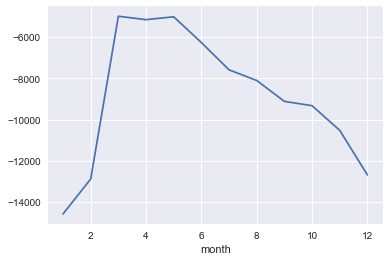

In [32]:
histdata.groupby('month')['purchase_amount'].sum().plot.line()

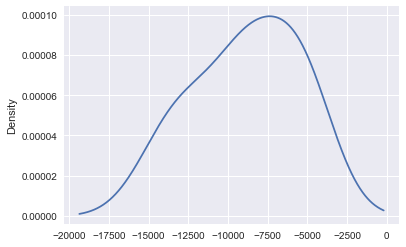

In [35]:
histdata.groupby('month')['purchase_amount'].sum().plot.density()

In [79]:
traindf1 = dftrain.copy()
testdf1 = dftest.copy()
histdatadf2 = dfhist.copy()
newdatadf2 = dfnewm.copy() 

In [46]:
import datetime
import time
import sys

# train & test data
# extract target value
target = traindf1['loyalty_score']

# Convert time as features
for data in [traindf1,testdf1]:
    data['first_active_month'] = pd.to_datetime(data['first_active_month'])
    data['year'] = data['first_active_month'].dt.year
    data['month'] = data['first_active_month'].dt.month

In [40]:
traindf.head()

,card_id,feature_1,feature_2,feature_3,year,month,date
0,C_ID_3c7fa72a88,3,3,1,2017,4,2017-04-01
1,C_ID_0e88908f2f,2,2,0,2017,11,2017-11-01
2,C_ID_f0c9288c95,3,1,1,2017,10,2017-10-01
3,C_ID_cd14e3a35a,3,1,1,2017,8,2017-08-01
4,C_ID_4d0a9b9fdb,5,2,1,2017,10,2017-10-01


In [47]:
traindf = traindf.drop(['date'], axis=1)
testdf = testdf.drop(['date'], axis=1)

In [49]:
traindf.head()

,card_id,feature_1,feature_2,feature_3,year,month
0,C_ID_3c7fa72a88,3,3,1,2017,4
1,C_ID_0e88908f2f,2,2,0,2017,11
2,C_ID_f0c9288c95,3,1,1,2017,10
3,C_ID_cd14e3a35a,3,1,1,2017,8
4,C_ID_4d0a9b9fdb,5,2,1,2017,10


In [50]:
newdatadf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 14 columns):
authorized_flag         6740 non-null object
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null object
installments            6740 non-null int64
category_3              6528 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6651 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6390 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 737.3+ KB


In [53]:
# Devide time 

def devide_time(data):
    data['purchase_date'] = pd.to_datetime(data['purchase_date'])
    data['month_diff'] = ((datetime.datetime.today() - data['purchase_date']).dt.days)//30  
    data['purchase_year'] = data['purchase_date'].dt.year
    data['purchase_month'] = data['purchase_date'].dt.month
    data['weekofyear'] = data['purchase_date'].dt.weekofyear
    data['dayofweek'] = data['purchase_date'].dt.dayofweek
    data['weekend'] = (data.purchase_date.dt.weekday >=5).astype(int)
    data['hour'] = data['purchase_date'].dt.hour
    return data

histdatadf1 = devide_time(histdatadf1)
newdatadf1 = devide_time(newdatadf1)

In [55]:
histdatadf1.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,...,category_2,state_id,subsector_id,month_diff,purchase_year,purchase_month,weekofyear,dayofweek,weekend,hour
0,Y,C_ID_ea299331ff,200,N,0,A,690,M_ID_7ecb602096,-5,-0.351846,...,2.0,18,1,18,2017,9,37,4,0,21
1,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_e95b1970c2,-10,-0.603029,...,2.0,18,33,23,2017,4,17,5,1,9
2,Y,C_ID_ea299331ff,200,N,0,A,307,M_ID_77d5389a7e,-3,-0.656749,...,2.0,18,19,16,2017,11,48,2,0,0
3,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_e95b1970c2,-4,-0.557754,...,2.0,18,33,18,2017,10,40,2,0,13
4,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_9a24c5f117,0,-0.603375,...,2.0,18,33,13,2018,2,9,2,0,11


In [73]:
histdatadf1.groupby('purchase_amount')['purchase_date'].count()

purchase_amount
-1.373942    16
-1.373883    12
-1.373823     1
-1.373408     3
-1.373349     2
-1.372815     3
-1.372637     1
-1.372340     1
-1.372281     1
-1.372222     1
-1.371866     1
-1.371807     1
-1.371570     1
-1.371156     2
-1.371037    38
-1.370800     1
-1.370564     1
-1.370445     1
-1.369972     1
-1.369795     1
-1.369736     1
-1.369558     3
-1.369499     1
-1.369322     2
-1.369263     2
-1.369086     2
-1.368968     1
-1.368731     3
-1.368377     1
-1.368318     1
             ..
 2.604237     1
 2.612030     1
 2.726519     3
 2.726716     1
 2.839665     1
 2.873431     1
 2.923994     1
 2.962008     1
 2.988919     1
 3.075044     1
 3.101793     1
 3.104696     1
 3.127168     1
 3.138563     1
 3.144461     1
 3.147324     7
 3.190292     1
 3.307192     1
 3.320929     1
 3.592278     1
 3.967380     1
 4.214076     2
 4.281935     1
 4.736715     4
 4.805797     1
 5.628909     1
 6.516907     1
 6.735634     1
 7.315155     1
 7.957100     1
Name: pu

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



ValueError: max must be larger than min in range parameter.

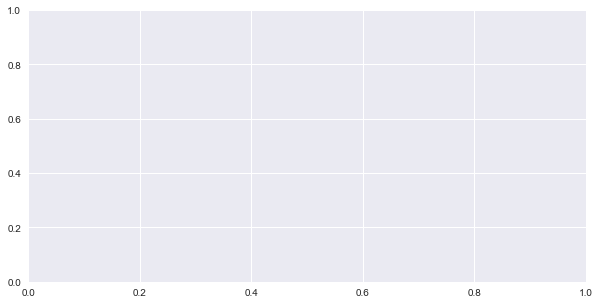

In [78]:
plt.figure(figsize=(10,5))
sns.distplot(histdatadf1['purchase_amount'].values, bins=50, kde=False, color="red")
plt.title("Histogram of Purchase Amount")
plt.xlabel('Purchase Amount', fontsize=12)
plt.show()

In [75]:
histdatadf1['purchase_amount'] = np.log1p(histdatadf1['purchase_amount'])

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning:

invalid value encountered in log1p



C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



ValueError: max must be larger than min in range parameter.

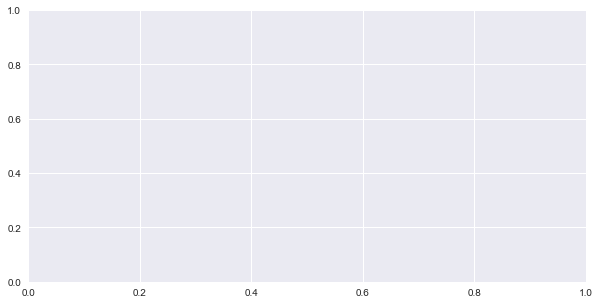

In [77]:
plt.figure(figsize=(10,5))
sns.distplot(histdatadf1['purchase_amount'].values, bins=50, kde=False, color="red")
plt.title("Histogram of Purchase Amount")
plt.xlabel('Purchase Amount', fontsize=12)
plt.show()

In [61]:
histdatadf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 21 columns):
authorized_flag         103617 non-null object
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              103617 non-null object
installments            103617 non-null int64
category_3              102970 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103159 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null datetime64[ns]
category_2              94284 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
month_diff              103617 non-null int64
purchase_year           103617 non-null int64
purchase_month          103617 non-null int64
weekofyear              103617 non-null int64
dayofweek               103617 non-null int6

In [58]:
histdatadf1.weekend.value_counts()


0    74376
1    29241
Name: weekend, dtype: int64

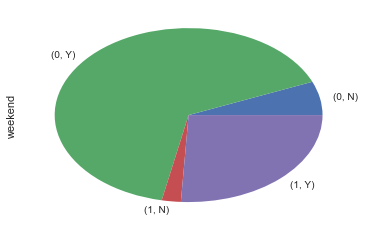

In [66]:
histdatadf1.groupby(['weekend', 'authorized_flag'])['weekend'].count().plot.pie()

In [82]:
from sklearn.preprocessing import StandardScaler

scl = StandardScaler()
histdatadf2['purchase_amount'] = scl.fit_transform(histdatadf2['purchase_amount'])

ValueError: Expected 2D array, got 1D array instead:
array=[-0.35184577 -0.60302894 -0.65674872 ... -0.52151012 -0.6266957
 -0.30062039].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [85]:
histdatadf2['purchase_amount'] = np.log1p(histdatadf2['purchase_amount'])

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



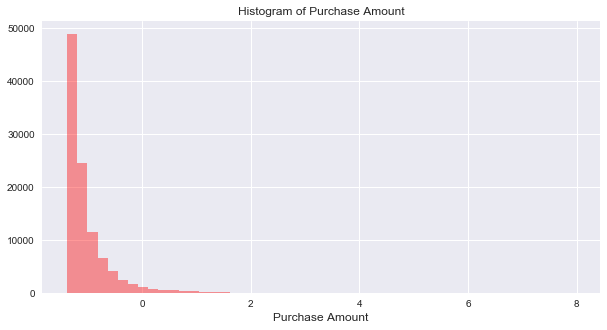

In [86]:
plt.figure(figsize=(10,5))
sns.distplot(histdatadf2['purchase_amount'].values, bins=50, kde=False, color="red")
plt.title("Histogram of Purchase Amount")
plt.xlabel('Purchase Amount', fontsize=12)
plt.show()

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



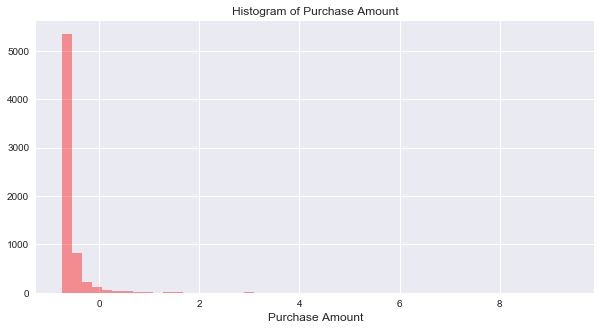

In [87]:

plt.figure(figsize=(10,5))
sns.distplot(newdatadf2['purchase_amount'].values, bins=50, kde=False, color="red")
plt.title("Histogram of Purchase Amount")
plt.xlabel('Purchase Amount', fontsize=12)
plt.show()

In [88]:
newdatadf2['purchase_amount'] = np.log1p(newdatadf2['purchase_amount'])

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



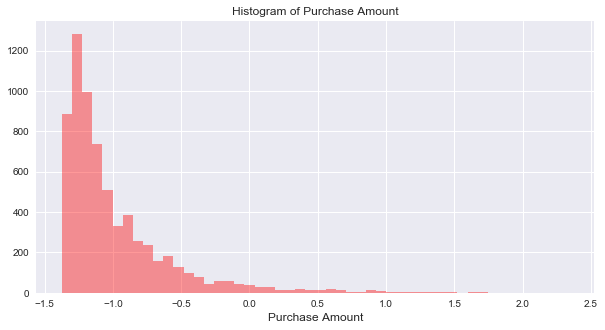

In [89]:
plt.figure(figsize=(10,5))
sns.distplot(newdatadf2['purchase_amount'].values, bins=50, kde=False, color="red")
plt.title("Histogram of Purchase Amount")
plt.xlabel('Purchase Amount', fontsize=12)
plt.show()

In [3]:
dftrain = dftrain.merge(dfhist, on='card_id',how='left')
dftest = dftest.merge(dfhist, on='card_id',how='left')

In [4]:
dftrain.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89573 entries, 0 to 89572
Data columns (total 19 columns):
first_active_month      89573 non-null object
card_id                 89573 non-null object
feature_1               89573 non-null int64
feature_2               89573 non-null int64
feature_3               89573 non-null int64
loyalty_score           89573 non-null float64
authorized_flag         89573 non-null object
city_id                 89573 non-null int64
category_1              89573 non-null object
installments            89573 non-null int64
category_3              89042 non-null object
merchant_category_id    89573 non-null int64
merchant_id             89182 non-null object
month_lag               89573 non-null int64
purchase_amount         89573 non-null float64
purchase_date           89573 non-null object
category_2              81682 non-null float64
state_id                89573 non-null int64
subsector_id            89573 non-null int64
dtypes: float64(3), int

In [5]:
dftest.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14044 entries, 0 to 14043
Data columns (total 18 columns):
first_active_month      14044 non-null object
card_id                 14044 non-null object
feature_1               14044 non-null int64
feature_2               14044 non-null int64
feature_3               14044 non-null int64
authorized_flag         14044 non-null object
city_id                 14044 non-null int64
category_1              14044 non-null object
installments            14044 non-null int64
category_3              13928 non-null object
merchant_category_id    14044 non-null int64
merchant_id             13977 non-null object
month_lag               14044 non-null int64
purchase_amount         14044 non-null float64
purchase_date           14044 non-null object
category_2              12602 non-null float64
state_id                14044 non-null int64
subsector_id            14044 non-null int64
dtypes: float64(2), int64(9), object(7)
memory usage: 2.0+ MB


In [ ]:
dftrain = dftrain.merge(dfhist, on='card_id',how='left')
dftest = dftest.merge(dfhist, on='card_id',how='left')

In [7]:
dftrain1 = dftrain.copy()
dftest1 = dftest.copy()

In [6]:
dfnewm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 14 columns):
authorized_flag         6740 non-null object
card_id                 6740 non-null object
city_id                 6740 non-null int64
category_1              6740 non-null object
installments            6740 non-null int64
category_3              6528 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6651 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6390 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 737.3+ KB


In [ ]:
dftrain1 = dfnewm.merge(dfhist, on='card_id',how='left')
mergresult = dfnewm.merge(dfhist, on='card_id',how='left')

In [19]:
result = pd.concat([dftest1, dfnewm], axis=0, join='left')

ValueError: Only can inner (intersect) or outer (union) join the other axis

In [15]:
result.isna().values.sum()

2276

In [18]:
mynonObjlist = []
mynonObjlist = result.columns[result.dtypes!=object]

for each in mynonObjlist:
    if result[each].dtypes == np.object:
        print('Its an Object')
    elif result[each].isnull().sum() != 0:
            print("{} ------ : {}".format(each, result[each].isnull().sum()))

category_2 ------ : 1792


In [16]:
result.head()

,card_id,authorized_flag,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,C_ID_2705885163,Y,297,N,3,C,607,M_ID_847afa8a19,-3,-0.468917,2017-09-21 16:33:53,1.0,9,29
1,C_ID_2705885163,Y,297,N,1,B,705,M_ID_0de11a8256,-3,-0.713143,2017-09-27 22:08:09,1.0,9,33
2,C_ID_2705885163,Y,297,N,3,C,690,M_ID_76210d6db9,-5,-0.476506,2017-07-29 13:21:41,1.0,9,1
3,C_ID_2705885163,Y,297,N,1,B,419,M_ID_4b708e69ac,-5,-0.693413,2017-07-15 12:19:56,1.0,9,1
4,C_ID_2705885163,Y,-1,Y,2,C,879,M_ID_ef87dd1879,-4,-0.538475,2017-08-15 12:10:49,NaN,-1,29


In [17]:
result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20784 entries, 0 to 6739
Data columns (total 14 columns):
card_id                 20784 non-null object
authorized_flag         20784 non-null object
city_id                 20784 non-null int64
category_1              20784 non-null object
installments            20784 non-null int64
category_3              20456 non-null object
merchant_category_id    20784 non-null int64
merchant_id             20628 non-null object
month_lag               20784 non-null int64
purchase_amount         20784 non-null float64
purchase_date           20784 non-null object
category_2              18992 non-null float64
state_id                20784 non-null int64
subsector_id            20784 non-null int64
dtypes: float64(2), int64(6), object(6)
memory usage: 2.4+ MB


In [39]:
dftrain = pd.read_csv('../RawData/train.csv')
dftest = pd.read_csv('../RawData/test.csv')
dfhist = pd.read_csv('../RawData/historical_transactions.csv')
dfnewm = pd.read_csv('../RawData/new_merchants.csv') 

In [24]:
dftrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 6 columns):
first_active_month    1000 non-null object
card_id               1000 non-null object
feature_1             1000 non-null int64
feature_2             1000 non-null int64
feature_3             1000 non-null int64
loyalty_score         1000 non-null float64
dtypes: float64(1), int64(3), object(2)
memory usage: 47.0+ KB


In [25]:
dftrain['card_id'].equals(dfhist['card_id'])

False

In [31]:
testuni = dfhist['card_id'].unique()

In [33]:
len(testuni)

1200

In [36]:
test1uni = dftrain['card_id'].unique()

In [37]:
len(test1uni)

1000

In [41]:
tester =  dfhist.groupby('card_id')['purchase_amount']

In [43]:
len(tester)

1200

In [44]:
tester1 =  dfnewm.groupby('card_id')['purchase_amount']

In [45]:
len(tester1)

1000

In [46]:
dftrain['card_id'].equals(dfnewm.groupby('card_id')['purchase_amount'])

False

In [49]:
prin = dftrain.card_id

In [50]:
len(prin)

1000

In [53]:
testt = pd.DataFrame()


In [27]:
dfhis = pd.merge(dftest, dfhist, on='card_id',how='inner')

In [28]:
dfhis.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14044 entries, 0 to 14043
Data columns (total 18 columns):
first_active_month      14044 non-null object
card_id                 14044 non-null object
feature_1               14044 non-null int64
feature_2               14044 non-null int64
feature_3               14044 non-null int64
authorized_flag         14044 non-null object
city_id                 14044 non-null int64
category_1              14044 non-null object
installments            14044 non-null int64
category_3              13928 non-null object
merchant_category_id    14044 non-null int64
merchant_id             13977 non-null object
month_lag               14044 non-null int64
purchase_amount         14044 non-null float64
purchase_date           14044 non-null object
category_2              12602 non-null float64
state_id                14044 non-null int64
subsector_id            14044 non-null int64
dtypes: float64(2), int64(9), object(7)
memory usage: 2.0+ MB


In [21]:
dftrain = dftrain.merge(dfhist, on='card_id',how='left')

In [22]:
dftrain.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89573 entries, 0 to 89572
Data columns (total 19 columns):
first_active_month      89573 non-null object
card_id                 89573 non-null object
feature_1               89573 non-null int64
feature_2               89573 non-null int64
feature_3               89573 non-null int64
loyalty_score           89573 non-null float64
authorized_flag         89573 non-null object
city_id                 89573 non-null int64
category_1              89573 non-null object
installments            89573 non-null int64
category_3              89042 non-null object
merchant_category_id    89573 non-null int64
merchant_id             89182 non-null object
month_lag               89573 non-null int64
purchase_amount         89573 non-null float64
purchase_date           89573 non-null object
category_2              81682 non-null float64
state_id                89573 non-null int64
subsector_id            89573 non-null int64
dtypes: float64(3), int

In [ ]:
def aggregate_times(data, prefix):  
#     data.loc[:, 'purchase_date'] = pd.DatetimeIndex(data['purchase_date']).astype(np.int64) * 1e-9

    agg_func = {
#         'purchase_date': [np.ptp, 'min', 'max','nunique'],  #np.ptp=pur_term
        'month_diff': ['mean','max','min'],
        'purchase_year': ['mean', 'max', 'min', 'std','nunique'],
        'purchase_month': ['mean', 'max', 'min', 'std','nunique'],
        'weekofyear': ['mean','max','min','nunique'],
        'dayofweek': ['mean'],
        'weekend': ['sum', 'mean'],
        'hour': ['mean','max','min']
    }    
    agg_times = data.groupby(['card_id']).agg(agg_func)
    agg_times.columns = [prefix + '_'.join(col).strip() 
                           for col in agg_times.columns.values]
    agg_times.reset_index(inplace=True)
    
    return agg_times

hist_times = aggregate_times(dfhist, 'hist_')
new_times = aggregate_times(new_times, 'new_')

In [8]:
dftrain = pd.read_csv('../RawData/train.csv')
dftest = pd.read_csv('../RawData/test.csv')
dfhist = pd.read_csv('../RawData/historical_transactions.csv')
dfnewm = pd.read_csv('../RawData/new_merchants.csv') 

In [9]:
train = dftrain.copy()
test = dftest.copy()
histdata = dfhist.copy()
newdata = dfnewm.copy()

In [59]:
import datetime
import time
import sys
# train & test data
# extract target value
target = train['loyalty_score']

# Convert time as features
for data in [train,test]:
    data['first_active_month'] = pd.to_datetime(data['first_active_month'])
    data['year'] = data['first_active_month'].dt.year
    data['month'] = data['first_active_month'].dt.month
    data['howlong'] = (datetime.date(2018,2,1) - data['first_active_month'].dt.date).dt.days

train = train.drop(['first_active_month','loyalty_score'], axis=1)
test = test.drop(['first_active_month'], axis=1)

In [60]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 7 columns):
card_id      1000 non-null object
feature_1    1000 non-null int64
feature_2    1000 non-null int64
feature_3    1000 non-null int64
year         1000 non-null int64
month        1000 non-null int64
howlong      1000 non-null int64
dtypes: int64(6), object(1)
memory usage: 54.8+ KB


In [61]:
# Convert category values
def category_convert(data):
    data['cat2'] = data['category_2']
    data['cat3'] = data['category_3']
    data = pd.get_dummies(data, columns=['cat2', 'cat3'])
    for bi_cat in ['authorized_flag', 'category_1']:
        data[bi_cat] = data[bi_cat].map({'Y':1, 'N':0})
    return data

histdata = category_convert(histdata)
newdata = category_convert(newdata)

In [62]:
histdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 22 columns):
authorized_flag         103617 non-null int64
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              103617 non-null int64
installments            103617 non-null int64
category_3              102970 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103159 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null object
category_2              94284 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
cat2_1.0                103617 non-null uint8
cat2_2.0                103617 non-null uint8
cat2_3.0                103617 non-null uint8
cat2_4.0                103617 non-null uint8
cat2_5.0                103617 non-null uint8
cat3_A  

In [63]:
# historical_transactions & new merchants transaction
# categorical data and other general data
def aggregate_trans(data, prefix):  
    agg_func = {
        'card_id': ['size'], #num_trans
        'authorized_flag': ['sum', 'mean','nunique'],
        'category_1': ['sum', 'mean','nunique'],
        'category_2': ['nunique'],
        'category_3': ['nunique'],
        'cat2_1.0': ['mean'],
        'cat2_2.0': ['mean'],
        'cat2_3.0': ['mean'],
        'cat2_4.0': ['mean'],
        'cat2_5.0': ['mean'],
        'cat3_A': ['mean'],
        'cat3_B': ['mean'],
        'cat3_C': ['mean'],
        'city_id': ['nunique'],
        'state_id': ['nunique'],
        'subsector_id': ['nunique'],
        'installments': ['sum', 'mean','median', 'max', 'min', 'std', 'nunique'],
        'merchant_id': ['nunique'],
        'merchant_category_id': ['nunique'],
        'month_lag': ['mean', 'max', 'min', 'std', 'nunique'],
        'purchase_amount': ['sum', 'mean', 'max', 'min', 'std', 'nunique']
    }    
    agg_trans = data.groupby(['card_id']).agg(agg_func)
    agg_trans.columns = [prefix + '_'.join(col).strip() for col in agg_trans.columns.values]
    agg_trans.reset_index(inplace=True)
    
    return agg_trans

hist_sum = aggregate_trans(histdata, 'hist_')
new_sum = aggregate_trans(newdata, 'new_')

In [64]:
hist_sum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 41 columns):
card_id                              1200 non-null object
hist_card_id_size                    1200 non-null int64
hist_authorized_flag_sum             1200 non-null int64
hist_authorized_flag_mean            1200 non-null float64
hist_authorized_flag_nunique         1200 non-null int64
hist_category_1_sum                  1200 non-null int64
hist_category_1_mean                 1200 non-null float64
hist_category_1_nunique              1200 non-null int64
hist_category_2_nunique              1200 non-null int64
hist_category_3_nunique              1200 non-null int64
hist_cat2_1.0_mean                   1200 non-null float64
hist_cat2_2.0_mean                   1200 non-null float64
hist_cat2_3.0_mean                   1200 non-null float64
hist_cat2_4.0_mean                   1200 non-null float64
hist_cat2_5.0_mean                   1200 non-null float64
hist_cat3_A_mean       

In [65]:
# Devide time 
# Code from: Chau Ngoc Huynh - "My first kernel (3.699)"

def devide_time(data):
    data['purchase_date'] = pd.to_datetime(data['purchase_date'])
    data['month_diff'] = ((datetime.datetime.today() - data['purchase_date']).dt.days)//30  
    data['purchase_year'] = data['purchase_date'].dt.year
    data['purchase_month'] = data['purchase_date'].dt.month
    data['weekofyear'] = data['purchase_date'].dt.weekofyear
    data['dayofweek'] = data['purchase_date'].dt.dayofweek
    data['weekend'] = (data.purchase_date.dt.weekday >=5).astype(int)
    data['hour'] = data['purchase_date'].dt.hour
    return data

hist_times = devide_time(histdata)
new_times = devide_time(newdata)

In [66]:
hist_times.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 29 columns):
authorized_flag         103617 non-null int64
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              103617 non-null int64
installments            103617 non-null int64
category_3              102970 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103159 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null datetime64[ns]
category_2              94284 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
cat2_1.0                103617 non-null uint8
cat2_2.0                103617 non-null uint8
cat2_3.0                103617 non-null uint8
cat2_4.0                103617 non-null uint8
cat2_5.0                103617 non-null uint8


In [67]:
def aggregate_times(data, prefix):  
#     data.loc[:, 'purchase_date'] = pd.DatetimeIndex(data['purchase_date']).astype(np.int64) * 1e-9

    agg_func = {
#         'purchase_date': [np.ptp, 'min', 'max','nunique'],  #np.ptp=pur_term
        'month_diff': ['mean','max','min'],
        'purchase_year': ['mean', 'max', 'min', 'std','nunique'],
        'purchase_month': ['mean', 'max', 'min', 'std','nunique'],
        'weekofyear': ['mean','max','min','nunique'],
        'dayofweek': ['mean'],
        'weekend': ['sum', 'mean'],
        'hour': ['mean','max','min']
    }    
    agg_times = data.groupby(['card_id']).agg(agg_func)
    agg_times.columns = [prefix + '_'.join(col).strip() 
                           for col in agg_times.columns.values]
    agg_times.reset_index(inplace=True)
    
    return agg_times

hist_times = aggregate_times(hist_times, 'hist_')
new_times = aggregate_times(new_times, 'new_')

In [68]:
hist_times.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 24 columns):
card_id                        1200 non-null object
hist_month_diff_mean           1200 non-null float64
hist_month_diff_max            1200 non-null int64
hist_month_diff_min            1200 non-null int64
hist_purchase_year_mean        1200 non-null float64
hist_purchase_year_max         1200 non-null int64
hist_purchase_year_min         1200 non-null int64
hist_purchase_year_std         1200 non-null float64
hist_purchase_year_nunique     1200 non-null int64
hist_purchase_month_mean       1200 non-null float64
hist_purchase_month_max        1200 non-null int64
hist_purchase_month_min        1200 non-null int64
hist_purchase_month_std        1200 non-null float64
hist_purchase_month_nunique    1200 non-null int64
hist_weekofyear_mean           1200 non-null float64
hist_weekofyear_max            1200 non-null int64
hist_weekofyear_min            1200 non-null int64
hist_weekofye

In [69]:
# purchase date term
histdata['pur_date'] = pd.DatetimeIndex(histdata['purchase_date']).date
newdata['pur_date'] = pd.DatetimeIndex(newdata['purchase_date']).date

histdata.loc[:,'pur_date'] = pd.DatetimeIndex(histdata['pur_date']).astype(np.int64) * 1e-9
newdata.loc[:,'pur_date'] = pd.DatetimeIndex(newdata['pur_date']).astype(np.int64) * 1e-9

agg_fn= {
        'pur_date': [np.ptp,'max','min'], # np.ptp: Range of values (maximum - minimum) 
        }
agg_hist = histdata.groupby(['card_id']).agg(agg_fn)
agg_hist.columns = ['_'.join(col).strip() for col in agg_hist.columns.values]
agg_hist.reset_index(inplace=True)

agg_new = newdata.groupby(['card_id']).agg(agg_fn)
agg_new.columns = ['_'.join(col).strip() for col in agg_new.columns.values]
agg_new.reset_index(inplace=True)

agg_hist.columns = ['hist_' + c if c != 'card_id' else c for c in agg_hist.columns]
agg_new.columns = ['new_' + c if c != 'card_id' else c for c in agg_new.columns]

# scale agg_hist, agg_new
import sklearn as sk
from sklearn import preprocessing

agg_hist['hist_pur_date_ptp']=sk.preprocessing.scale(agg_hist['hist_pur_date_ptp'])
agg_new['new_pur_date_ptp']=sk.preprocessing.scale(agg_new['new_pur_date_ptp'])
agg_hist['hist_pur_date_max']=sk.preprocessing.scale(agg_hist['hist_pur_date_max'])
agg_new['new_pur_date_max']=sk.preprocessing.scale(agg_new['new_pur_date_max'])
agg_hist['hist_pur_date_min']=sk.preprocessing.scale(agg_hist['hist_pur_date_min'])
agg_new['new_pur_date_min']=sk.preprocessing.scale(agg_new['new_pur_date_min'])

C:\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:164: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "


In [70]:
# merge 
hist = hist_times.merge(hist_sum,on='card_id',how='left')
hist = hist.merge(agg_hist, on='card_id',how='left')
del hist_sum
del hist_times
del agg_hist

new = new_times.merge(new_sum, on='card_id',how='left')
new = new.merge(agg_new, on='card_id',how='left')
del new_sum
del new_times
del agg_new

In [71]:
train = train.merge(hist, on='card_id',how='left')
train = train.merge(new, on='card_id',how='left')

test = test.merge(hist, on='card_id',how='left')
test = test.merge(new, on='card_id',how='left')

train.head()

,card_id,feature_1,feature_2,feature_3,year,month,howlong,hist_month_diff_mean,hist_month_diff_max,hist_month_diff_min,...,new_month_lag_nunique,new_purchase_amount_sum,new_purchase_amount_mean,new_purchase_amount_max,new_purchase_amount_min,new_purchase_amount_std,new_purchase_amount_nunique,new_pur_date_ptp,new_pur_date_max,new_pur_date_min
0,C_ID_3c7fa72a88,3,3,1,2017,4,306,20.444444,24,19,...,2.0,-1.127574,-0.563787,-0.430600,-0.696975,0.188356,2.0,0.271101,-2.316483,-2.395570
1,C_ID_0e88908f2f,2,2,0,2017,11,92,14.677419,16,13,...,2.0,-7.888363,-0.657364,-0.521510,-0.737892,0.076641,11.0,0.992525,0.503221,0.219004
2,C_ID_f0c9288c95,3,1,1,2017,10,123,16.000000,18,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,C_ID_cd14e3a35a,3,1,1,2017,8,184,16.631579,19,13,...,2.0,-0.900419,-0.450209,-0.178906,-0.721513,0.383681,2.0,0.374162,0.370356,0.263319
4,C_ID_4d0a9b9fdb,5,2,1,2017,10,123,13.921875,17,13,...,2.0,-7.092994,-0.545615,-0.073720,-0.721363,0.168696,13.0,1.250177,0.591798,0.233775


In [72]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 0 to 199
Columns: 139 entries, card_id to new_pur_date_min
dtypes: float64(98), int32(1), int64(39), object(1)
memory usage: 218.0+ KB


In [4]:
test.head()

,first_active_month,card_id,feature_1,feature_2,feature_3
0,2017-07,C_ID_2705885163,2,1,0
1,2016-06,C_ID_096b6fa30d,2,2,0
2,2016-12,C_ID_3e1c208f74,1,3,0
3,2017-09,C_ID_23995c6879,5,1,1
4,2017-01,C_ID_7d0553395a,4,2,0


In [5]:
train.head()

,first_active_month,card_id,feature_1,feature_2,feature_3,loyalty_score
0,2017-04,C_ID_3c7fa72a88,3,3,1,1.463612
1,2017-11,C_ID_0e88908f2f,2,2,0,-0.086608
2,2017-10,C_ID_f0c9288c95,3,1,1,1.367614
3,2017-08,C_ID_cd14e3a35a,3,1,1,-1.245025
4,2017-10,C_ID_4d0a9b9fdb,5,2,1,0.293999


In [16]:
grouphist = histdata.groupby('card_id')[histdata.columns]

In [17]:
grouphist.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_ea299331ff,200,N,0,A,690,M_ID_7ecb602096,-5,-0.351846,2017-09-15 21:15:41,2.0,18,1
1,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_e95b1970c2,-10,-0.603029,2017-04-29 09:46:35,2.0,18,33
2,Y,C_ID_ea299331ff,200,N,0,A,307,M_ID_77d5389a7e,-3,-0.656749,2017-11-29 00:00:00,2.0,18,19
3,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_e95b1970c2,-4,-0.557754,2017-10-04 13:45:29,2.0,18,33
4,Y,C_ID_ea299331ff,200,N,0,A,705,M_ID_9a24c5f117,0,-0.603375,2018-02-28 11:38:42,2.0,18,33
46,Y,C_ID_16e1a96d67,274,N,0,A,273,M_ID_09563a2fc3,-4,-0.679288,2017-10-10 00:00:00,1.0,9,20
47,Y,C_ID_16e1a96d67,143,N,0,A,506,M_ID_a9d91682ad,-6,-0.712497,2017-08-22 17:22:26,5.0,5,30
48,Y,C_ID_16e1a96d67,274,N,0,A,419,M_ID_1599bfb561,-8,-0.668770,2017-06-27 17:23:04,1.0,9,1
49,Y,C_ID_16e1a96d67,23,N,0,A,422,M_ID_f876790463,-13,-0.709492,2017-01-31 16:34:33,1.0,9,27
50,Y,C_ID_16e1a96d67,274,N,0,A,206,M_ID_8a8cd1e49b,-12,-0.721363,2017-02-08 18:04:43,1.0,9,1


In [2]:
dftrain = pd.read_csv('../RawData/train.csv')
dftest = pd.read_csv('../RawData/test.csv')
dfhist = pd.read_csv('../RawData/historical_transactions.csv')
dfnewm = pd.read_csv('../RawData/new_merchants.csv') 

In [3]:
train = dftrain.copy()
test = dftest.copy()
histdata = dfhist.copy()
newdata = dfnewm.copy()

In [31]:
agg_fun = {'purchase_amount': ['sum', 'mean']}
auth_mean = histdata.groupby(['card_id']).agg(agg_fun)
auth_mean.columns = ['_hist'.join(col).strip() for col in auth_mean.columns.values]
auth_mean.reset_index(inplace=True)

In [32]:
auth_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 3 columns):
card_id                     1200 non-null object
purchase_amount_histsum     1200 non-null float64
purchase_amount_histmean    1200 non-null float64
dtypes: float64(2), object(1)
memory usage: 28.2+ KB


In [33]:
train = train.merge(auth_mean, on='card_id',how='left')
test = test.merge(auth_mean, on='card_id',how='left')

In [34]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 8 columns):
first_active_month          1000 non-null object
card_id                     1000 non-null object
feature_1                   1000 non-null int64
feature_2                   1000 non-null int64
feature_3                   1000 non-null int64
loyalty_score               1000 non-null float64
purchase_amount_histsum     1000 non-null float64
purchase_amount_histmean    1000 non-null float64
dtypes: float64(3), int64(3), object(2)
memory usage: 70.3+ KB


In [35]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 0 to 199
Data columns (total 7 columns):
first_active_month          200 non-null object
card_id                     200 non-null object
feature_1                   200 non-null int64
feature_2                   200 non-null int64
feature_3                   200 non-null int64
purchase_amount_histsum     200 non-null float64
purchase_amount_histmean    200 non-null float64
dtypes: float64(2), int64(3), object(2)
memory usage: 12.5+ KB


In [36]:
agg_fun = {'purchase_amount': ['sum', 'mean']}
auth_mean = newdata.groupby(['card_id']).agg(agg_fun)
auth_mean.columns = ['_hist'.join(col).strip() for col in auth_mean.columns.values]
auth_mean.reset_index(inplace=True)

In [37]:
train = train.merge(auth_mean, on='card_id',how='left')
test = test.merge(auth_mean, on='card_id',how='left')

In [38]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 0 to 199
Data columns (total 9 columns):
first_active_month            200 non-null object
card_id                       200 non-null object
feature_1                     200 non-null int64
feature_2                     200 non-null int64
feature_3                     200 non-null int64
purchase_amount_histsum_x     200 non-null float64
purchase_amount_histmean_x    200 non-null float64
purchase_amount_histsum_y     0 non-null float64
purchase_amount_histmean_y    0 non-null float64
dtypes: float64(4), int64(3), object(2)
memory usage: 15.6+ KB


In [4]:
low = .05
high = .95
quant_df = histdata.quantile([low, high])
print(quant_df)

      city_id  installments  merchant_category_id  month_lag  purchase_amount  \
0.05     -1.0           0.0                  80.0      -11.0        -0.737892   
0.95    331.0           2.0                 879.0        0.0        -0.185656   

      category_2  state_id  subsector_id  
0.05         1.0      -1.0           7.0  
0.95         5.0      22.0          37.0  


In [7]:
filt_hisdata = histdata[['city_id', 'installments', 'merchant_category_id', 'month_lag', 'purchase_amount', 'category_2', 'state_id', 'subsector_id']].apply(lambda x: x[(x>quant_df.loc[low,x.name]) & 
                                    (x < quant_df.loc[high,x.name])], axis=0)

In [8]:
filt_hisdata.head()

,city_id,installments,merchant_category_id,month_lag,purchase_amount,category_2,state_id,subsector_id
0,200.0,NaN,690.0,-5.0,-0.351846,2.0,18.0,NaN
1,200.0,NaN,705.0,-10.0,-0.603029,2.0,18.0,33.0
2,200.0,NaN,307.0,-3.0,-0.656749,2.0,18.0,19.0
3,200.0,NaN,705.0,-4.0,-0.557754,2.0,18.0,33.0
4,200.0,NaN,705.0,NaN,-0.603375,2.0,18.0,33.0


In [9]:
filt_hisdata.dropna(inplace=True)

In [11]:
filt_hisdata.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4032 entries, 735 to 103598
Data columns (total 8 columns):
city_id                 4032 non-null float64
installments            4032 non-null float64
merchant_category_id    4032 non-null float64
month_lag               4032 non-null float64
purchase_amount         4032 non-null float64
category_2              4032 non-null float64
state_id                4032 non-null float64
subsector_id            4032 non-null float64
dtypes: float64(8)
memory usage: 283.5 KB


In [12]:
filt_hisdata.head()

,city_id,installments,merchant_category_id,month_lag,purchase_amount,category_2,state_id,subsector_id
735,200.0,1.0,755.0,-5.0,-0.724368,2.0,18.0,8.0
1289,170.0,1.0,705.0,-3.0,-0.295136,3.0,8.0,33.0
1294,170.0,1.0,705.0,-1.0,-0.665149,3.0,8.0,33.0
1296,170.0,1.0,705.0,-1.0,-0.615937,3.0,8.0,33.0
1302,251.0,1.0,683.0,-1.0,-0.655246,3.0,8.0,34.0


In [13]:
correlations = filt_hisdata.corr()# taking correlation into variable
attrs = correlations.iloc[:-1,:-1] # all except target

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()

unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), 
        columns=['Attribute Pair', 'Correlation'])

    # sorted by absolute value
unique_important_corrs = unique_important_corrs.iloc[
    abs(unique_important_corrs['Correlation']).argsort()[::-1]]

unique_important_corrs

,Attribute Pair,Correlation


<Figure size 1440x1440 with 0 Axes>

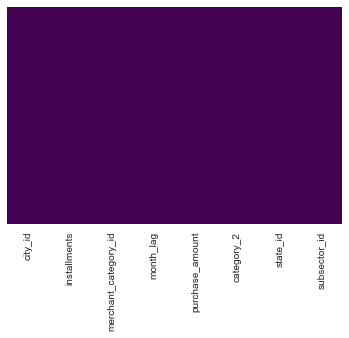

<Figure size 1440x1440 with 0 Axes>

In [16]:
## Missig Data heatmap

sns.heatmap(filt_hisdata.isnull(),yticklabels=False,cbar=False,cmap='viridis')
sns.set(font_scale=1.30)
plt.figure(figsize=(20,20))

In [17]:
filt_hisdata.isna().values.sum()

0

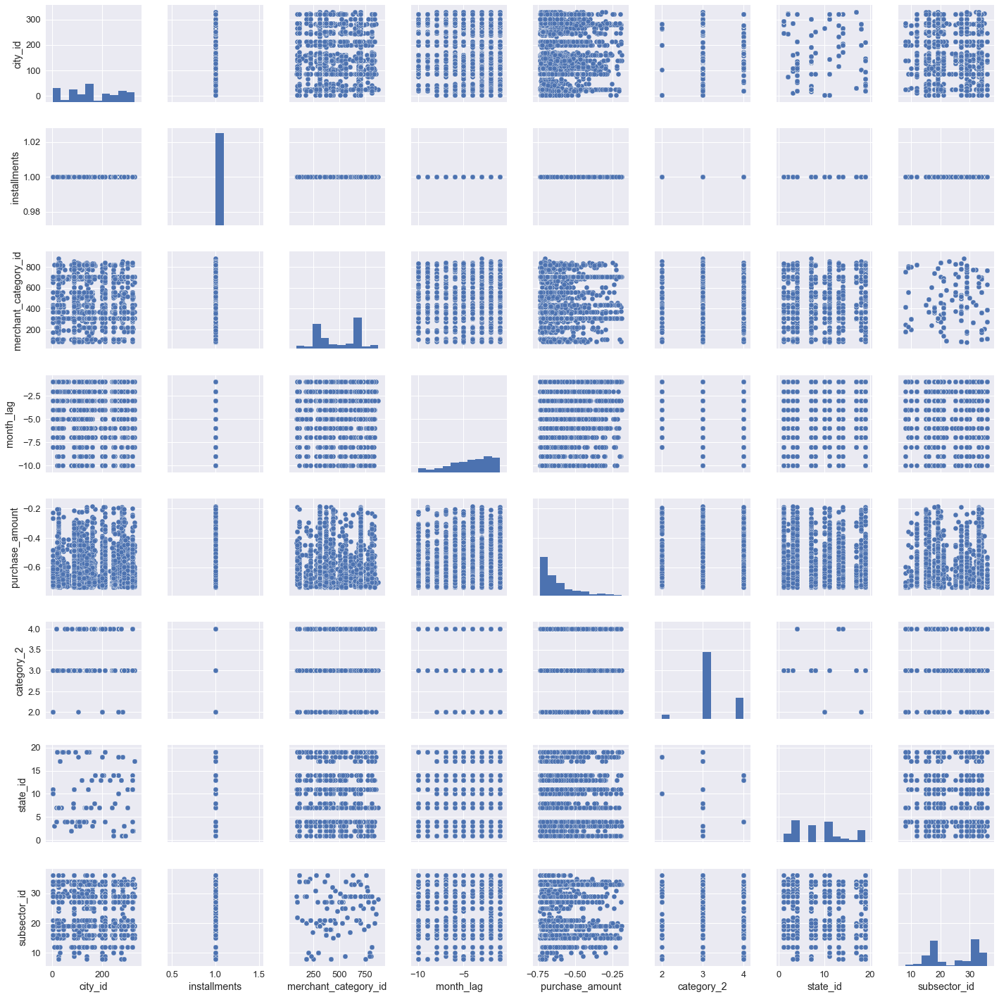

In [18]:
sns.pairplot(filt_hisdata)

In [20]:
corr=filt_hisdata.corr()["purchase_amount"]
corr[np.argsort(corr, axis=0)[::-1]]

month_lag              -0.067878
city_id                 0.088780
purchase_amount         1.000000
merchant_category_id   -0.104080
installments                 NaN
category_2             -0.005193
subsector_id           -0.146203
state_id               -0.118439
Name: purchase_amount, dtype: float64

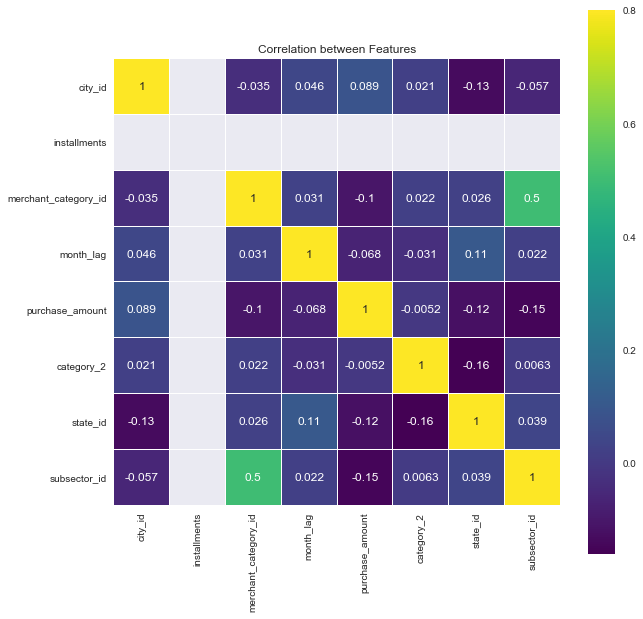

In [21]:
corrMatrix = filt_hisdata.corr()

sns.set(font_scale=1)
plt.figure(figsize=(10, 10))

sns.heatmap(corrMatrix, vmax=.8, linewidths=0.01,
            square=True,annot=True,cmap='viridis',linecolor="white")
plt.title('Correlation between Features');

In [26]:
from sklearn.preprocessing import LabelEncoder,OneHotEncoder

labelEnc=LabelEncoder()

myObjlist = ['category_3', 'merchant_id']
##myObjlist = newdata.columns[newdata.dtypes==object]

for col in myObjlist:
    newdata[col]=labelEnc.fit_transform(newdata[col])

TypeError: '<' not supported between instances of 'str' and 'float'

In [23]:
newdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 14 columns):
authorized_flag         6740 non-null int64
card_id                 6740 non-null int64
city_id                 6740 non-null int64
category_1              6740 non-null int64
installments            6740 non-null int64
category_3              6528 non-null object
merchant_category_id    6740 non-null int64
merchant_id             6651 non-null object
month_lag               6740 non-null int64
purchase_amount         6740 non-null float64
purchase_date           6740 non-null object
category_2              6390 non-null float64
state_id                6740 non-null int64
subsector_id            6740 non-null int64
dtypes: float64(2), int64(9), object(3)
memory usage: 737.3+ KB


In [31]:
# Convert category values
def category_convert(data):
    data['category2'] = data['category_2']
    data['category3'] = data['category_3']
    data = pd.get_dummies(data, columns=['category2', 'category3'])
    for bi_cat in ['authorized_flag', 'category_1']:
        data[bi_cat] = data[bi_cat].map({'Y':1, 'N':0})
    return data

histdata = category_convert(histdata)
newdata = category_convert(newdata)

In [32]:
histdata.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,...,cat3_B,cat3_C,category2_1.0,category2_2.0,category2_3.0,category2_4.0,category2_5.0,category3_A,category3_B,category3_C
0,NaN,C_ID_ea299331ff,200,NaN,0,A,690,M_ID_7ecb602096,-5,-0.351846,...,0,0,0,1,0,0,0,1,0,0
1,NaN,C_ID_ea299331ff,200,NaN,0,A,705,M_ID_e95b1970c2,-10,-0.603029,...,0,0,0,1,0,0,0,1,0,0
2,NaN,C_ID_ea299331ff,200,NaN,0,A,307,M_ID_77d5389a7e,-3,-0.656749,...,0,0,0,1,0,0,0,1,0,0
3,NaN,C_ID_ea299331ff,200,NaN,0,A,705,M_ID_e95b1970c2,-4,-0.557754,...,0,0,0,1,0,0,0,1,0,0
4,NaN,C_ID_ea299331ff,200,NaN,0,A,705,M_ID_9a24c5f117,0,-0.603375,...,0,0,0,1,0,0,0,1,0,0


In [33]:
take = histdata.groupby('city_id')['state_id'].count()

In [35]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 6 columns):
first_active_month    1000 non-null object
card_id               1000 non-null object
feature_1             1000 non-null int64
feature_2             1000 non-null int64
feature_3             1000 non-null int64
loyalty_score         1000 non-null float64
dtypes: float64(1), int64(3), object(2)
memory usage: 47.0+ KB


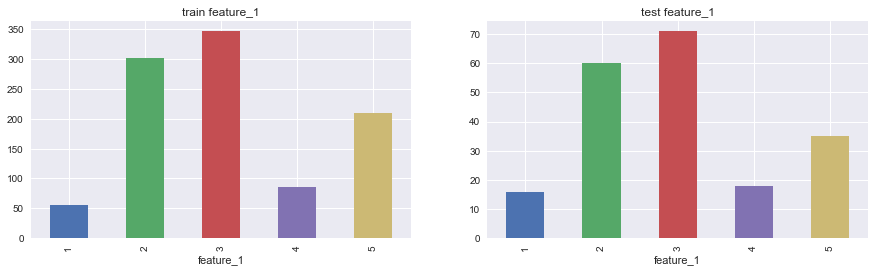

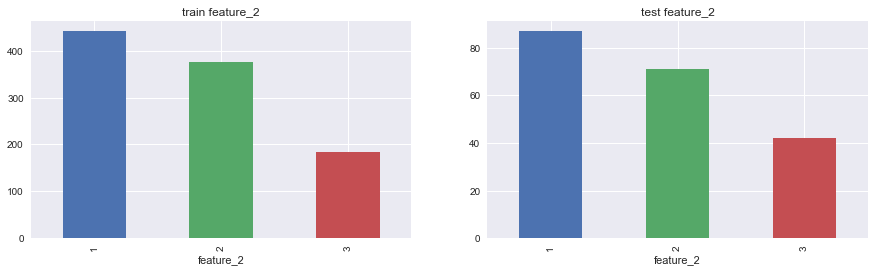

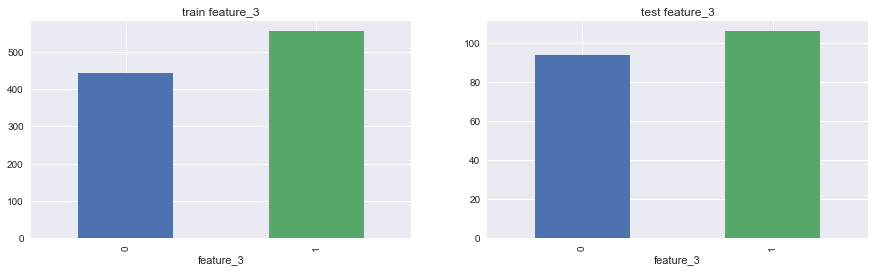

In [36]:
features = ['feature_1', 'feature_2', 'feature_3']
for feature in features:
    fig, axes = plt.subplots(nrows=1, ncols=2)
    train.groupby(feature).count()['first_active_month'].plot(kind='bar',
                                                              title='train {}'.format(feature),
                                                              figsize=(15, 4),
                                                              ax=axes[0])
    test.groupby(feature).count()['first_active_month'].plot(kind='bar',
                                                              title='test {}'.format(feature),
                                                              figsize=(15, 4))
    plt.show()

In [37]:
# Create features from historic transactions
gdf = histdata.groupby("card_id")
gdf = gdf["purchase_amount"].agg(['sum', 'mean', 'std', 'min', 'max']).reset_index()
gdf.columns = ["card_id", "sum_hist_trans", "mean_hist_trans", "std_hist_trans", "min_hist_trans", "max_hist_trans"]

In [43]:
gdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 6 columns):
card_id                    1200 non-null object
sum_install_hist_trans     1200 non-null int64
mean_install_hist_trans    1200 non-null float64
std_install_hist_trans     1200 non-null float64
min_install_hist_trans     1200 non-null int64
max_install_hist_trans     1200 non-null int64
dtypes: float64(2), int64(3), object(1)
memory usage: 56.3+ KB


In [40]:
gdf.head()

,card_id,sum_hist_trans,mean_hist_trans,std_hist_trans,min_hist_trans,max_hist_trans
0,C_ID_00370b000a,-11.210123,-0.659419,0.041704,-0.732497,-0.595891
1,C_ID_003904d29f,-9.410969,-0.627398,0.143732,-0.727884,-0.203098
2,C_ID_00892c8924,-3.804247,-0.211347,0.348585,-0.587026,0.754241
3,C_ID_00d285cf7e,-70.382213,-0.683322,0.068010,-0.744804,-0.455649
4,C_ID_0108beb1a8,77.159155,1.353669,1.361899,-0.533561,4.464797


In [41]:
# Create features from historic transactions
gdf = histdata.groupby("card_id")
gdf = gdf["installments"].agg(['sum', 'mean', 'std', 'min', 'max']).reset_index()
gdf.columns = ["card_id", "sum_install_hist_trans", "mean_install_hist_trans", "std_install_hist_trans", "min_install_hist_trans", "max_install_hist_trans"]

In [42]:
gdf.head()

,card_id,sum_install_hist_trans,mean_install_hist_trans,std_install_hist_trans,min_install_hist_trans,max_install_hist_trans
0,C_ID_00370b000a,0,0.000000,0.000000,0,0
1,C_ID_003904d29f,17,1.133333,0.351866,1,2
2,C_ID_00892c8924,40,2.222222,0.878204,1,4
3,C_ID_00d285cf7e,0,0.000000,0.000000,0,0
4,C_ID_0108beb1a8,0,0.000000,0.000000,0,0


In [44]:
def create_features(df):
    # One-hot encode features
    feat1 = pd.get_dummies(df['feature_1'], prefix='f1_')
    feat2 = pd.get_dummies(df['feature_2'], prefix='f2_')
    feat3 = pd.get_dummies(df['feature_3'], prefix='f3_')
    return pd.concat([feat1, feat2, feat3], axis=1, sort=False)

In [46]:
test_fet = create_features(test)

In [47]:
train_fet = create_features(train)

In [48]:
train_fet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 10 columns):
f1__1    1000 non-null uint8
f1__2    1000 non-null uint8
f1__3    1000 non-null uint8
f1__4    1000 non-null uint8
f1__5    1000 non-null uint8
f2__1    1000 non-null uint8
f2__2    1000 non-null uint8
f2__3    1000 non-null uint8
f3__0    1000 non-null uint8
f3__1    1000 non-null uint8
dtypes: uint8(10)
memory usage: 9.8 KB


In [41]:
# Create features from historic transactions
gdf = histdata.groupby("card_id")
gdf = gdf["installments"].agg(['sum', 'mean', 'std', 'min', 'max']).reset_index()
gdf.columns = ["card_id", "sum_install_hist_trans", "mean_install_hist_trans", "std_install_hist_trans", "min_install_hist_trans", "max_install_hist_trans"]

In [49]:
gdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 6 columns):
card_id                    1200 non-null object
sum_install_hist_trans     1200 non-null int64
mean_install_hist_trans    1200 non-null float64
std_install_hist_trans     1200 non-null float64
min_install_hist_trans     1200 non-null int64
max_install_hist_trans     1200 non-null int64
dtypes: float64(2), int64(3), object(1)
memory usage: 56.3+ KB


In [50]:
gdf = histdata.groupby("card_id")

In [ ]:
agg_func = {
        'authorized_flag': ['nunique'],
        'city_id': ['nunique'],
        'state_id': ['nunique'], 
        'subsector_id': ['nunique'],
        'category_1': [np.m, 'min', 'max'],
        'category2_1.0' :['mode', 'min', 'max'],
        'category2_2.0' :['mode', 'min', 'max'],
        'category2_3.0' :['mode', 'min', 'max'],
        'category2_4.0' :['mode', 'min', 'max'],
        'category2_5.0' :['mode', 'min', 'max'],
        'category3_A' :['mode', 'min', 'max'],
        'category3_B' :['mode', 'min', 'max'],
        'category3_C' :['mode', 'min', 'max'],
        'installments': ['median', 'max'],
        'merchant_category_id': ['nunique'], 
        'merchant_id': ['nunique'],
        'month_lag': ['min', 'median', 'max'],
        'purchase_amount': ['sum', 'median', 'max', 'min'],
        'purchase_year': ['nunique'],
        'purchase_month': ['nunique'],
        'weekofyear': ['nunique'],
        'dayofweek': ['nunique'],
        'weekend': ['nunique'],
        'hour': ['nunique'],               
        }


agg_history = dfhist.groupby(['card_id']).agg(agg_func)
agg_history.columns = ['hist_' + '_'.join(col).strip() for col in agg_history.columns.values]
agg_history.reset_index(inplace=True)

In [54]:
def apply_mode(df,grpby, col):
    df[col] = df.groupby(grpby)[col].apply(lambda x: x.mode())

In [74]:
test_inst = histdata.groupby('card_id')['cat3_A'].apply(lambda x: x.mode()).reset_index()

In [75]:
histdata['cat3_A'] = test_inst.cat3_A

In [78]:
histdata.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,...,cat3_B,cat3_C,category2_1.0,category2_2.0,category2_3.0,category2_4.0,category2_5.0,category3_A,category3_B,category3_C
0,NaN,C_ID_ea299331ff,200,NaN,C_ID_1195b45e31,A,690,M_ID_7ecb602096,-5,-0.351846,...,0,0,0,1,0,0,0,1,0,0
1,NaN,C_ID_ea299331ff,200,NaN,C_ID_ae51caac6c,A,705,M_ID_e95b1970c2,-10,-0.603029,...,0,0,0,1,0,0,0,1,0,0
2,NaN,C_ID_ea299331ff,200,NaN,C_ID_b719517c13,A,307,M_ID_77d5389a7e,-3,-0.656749,...,0,0,0,1,0,0,0,1,0,0
3,NaN,C_ID_ea299331ff,200,NaN,C_ID_d1d4144c3a,A,705,M_ID_e95b1970c2,-4,-0.557754,...,0,0,0,1,0,0,0,1,0,0
4,NaN,C_ID_ea299331ff,200,NaN,C_ID_df564bbca3,A,705,M_ID_9a24c5f117,0,-0.603375,...,0,0,0,1,0,0,0,1,0,0


In [77]:
test_inst

,card_id,level_1,cat3_A
0,C_ID_00370b000a,0,1
1,C_ID_003904d29f,0,0
2,C_ID_00892c8924,0,0
3,C_ID_00d285cf7e,0,1
4,C_ID_0108beb1a8,0,1
5,C_ID_01165a17a0,0,0
6,C_ID_0154533635,0,0
7,C_ID_0199a60015,0,0
8,C_ID_01a5f0c5f1,0,0
9,C_ID_01ab770cb7,0,0


In [83]:
histdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103617 entries, 0 to 103616
Data columns (total 30 columns):
authorized_flag         0 non-null float64
card_id                 103617 non-null object
city_id                 103617 non-null int64
category_1              0 non-null float64
installments            211 non-null object
category_3              102970 non-null object
merchant_category_id    103617 non-null int64
merchant_id             103159 non-null object
month_lag               103617 non-null int64
purchase_amount         103617 non-null float64
purchase_date           103617 non-null object
category_2              94284 non-null float64
state_id                103617 non-null int64
subsector_id            103617 non-null int64
cat2_1.0                103617 non-null uint8
cat2_2.0                103617 non-null uint8
cat2_3.0                103617 non-null uint8
cat2_4.0                103617 non-null uint8
cat2_5.0                103617 non-null uint8
cat3_A          

In [ ]:
def percentile(n):
    def _percentile(x):
        return np.percentile(x, n)
    _percentile.__name__ = '{}-th percentile'.format(n)
    return _percentile

gdf = df.groupby('species').agg({
    'sepal width': {
        'width min': 'min',
        'width max': 'max'
    },
    'sepal length': ['max', 'mean', percentile(20)]
})

In [81]:
def apply_mode(df,grpby, col):
    return df.groupby(grpby)[col].apply(lambda x: x.mode())

In [82]:
apply_mode(histdata, 'card_id', 'cat3_B')

card_id           
C_ID_00370b000a  0    0
C_ID_003904d29f  0    1
C_ID_00892c8924  0    0
C_ID_00d285cf7e  0    0
C_ID_0108beb1a8  0    0
C_ID_01165a17a0  0    1
C_ID_0154533635  0    1
C_ID_0199a60015  0    0
                 1    1
C_ID_01a5f0c5f1  0    0
C_ID_01ab770cb7  0    0
C_ID_01bf4cca37  0    1
C_ID_01cb2635e5  0    1
C_ID_020d1cc938  0    1
C_ID_025b4d8a5c  0    0
C_ID_02754f0f3e  0    1
C_ID_027c1096bf  0    0
C_ID_02a8e96344  0    0
C_ID_0315c0c955  0    0
C_ID_039e458213  0    0
C_ID_03ad141024  0    0
C_ID_0462ded3ea  0    1
C_ID_0471d161e5  0    0
C_ID_04afbf997a  0    0
C_ID_04c429dc57  0    0
C_ID_04ccd44c3e  0    0
C_ID_04eff0925e  0    0
C_ID_05695bbce4  0    0
C_ID_05c6c06231  0    0
C_ID_0645f596e6  0    0
                     ..
C_ID_f91cc3643c  0    0
C_ID_f97815ba14  0    0
C_ID_f9a55eab10  0    1
C_ID_f9b439428d  0    0
C_ID_f9dc8d3add  0    0
C_ID_fa1536f993  0    1
C_ID_fa47ad79b7  0    1
C_ID_fb1b053c24  0    1
C_ID_fb22a27dd1  0    1
C_ID_fb48e1e985  0   

In [96]:
agg_func = {
        'authorized_flag': ['nunique'],
        'city_id': ['nunique'],
        'state_id': ['nunique'], 
        'subsector_id': ['nunique'],
        'category_1': ['min', 'max']            
        }

In [97]:
agg_history = dfhist.groupby(['card_id']).agg(agg_func)

In [98]:
agg_history.head()

authorized_flag city_id state_id subsector_id category_1    
                        nunique nunique  nunique      nunique        min max
card_id                                                                     
C_ID_00370b000a               2       4        4            5          N   N
C_ID_003904d29f               1       5        2            9          N   N
C_ID_00892c8924               1       2        2            8          N   Y
C_ID_00d285cf7e               2       5        3            8          N   N
C_ID_0108beb1a8               1       2        2            8          N   N

In [ ]:
   'category2_1.0' :['mode', 'min', 'max'],
        'category2_2.0' :['mode', 'min', 'max'],
        'category2_3.0' :['mode', 'min', 'max'],
        'category2_4.0' :['mode', 'min', 'max'],
        'category2_5.0' :['mode', 'min', 'max'],
        'category3_A' :['mode', 'min', 'max'],
        'category3_B' :['mode', 'min', 'max'],
        'category3_C' :['mode', 'min', 'max'],
        'merchant_category_id': ['nunique'], 
        'merchant_id': ['nunique'],
        'month_lag': ['min', 'median', 'max'],
        'purchase_amount': ['sum', 'median', 'max', 'min'],
        'purchase_year': ['nunique'],
        'purchase_month': ['nunique'],
        'weekofyear': ['nunique'],
        'dayofweek': ['nunique'],
        'weekend': ['nunique'],

In [101]:
vari = histdata.groupby('card_id')['city_id'].value_counts()

In [103]:
vari.head()

card_id          city_id
C_ID_00370b000a  302        10
                 69          4
                 20          2
                 170         1
C_ID_003904d29f  69          6
Name: city_id, dtype: int64

In [128]:
vari['C_ID_00370b000a'][:1][:1]

city_id
302    10
Name: city_id, dtype: int64

In [134]:
from scipy import stats
sample = histdata.groupby('card_id').agg(lambda x: stats.mode(x)[0][0])

C:\Anaconda3\lib\site-packages\scipy\stats\stats.py:245: RuntimeWarning:

The input array could not be properly checked for nan values. nan values will be ignored.



,authorized_flag,city_id,category_1,merchant_category_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,...,cat3_B,cat3_C,category2_1.0,category2_2.0,category2_3.0,category2_4.0,category2_5.0,category3_A,category3_B,category3_C
card_id,,,,,,,,,,,,,,,,,,,,,
C_ID_00370b000a,0.0,302,0.0,307,0,-0.671775,2017-04-26 12:34:07,3.0,7,19,...,0,0,0,0,1,0,0,1,0,0
C_ID_003904d29f,0.0,69,0.0,80,-1,-0.727884,2017-12-29 19:19:14,1.0,9,37,...,1,0,1,0,0,0,0,0,1,0
C_ID_00892c8924,0.0,-1,0.0,879,-4,-0.587026,2017-04-26 11:10:35,3.0,-1,29,...,0,1,0,0,0,0,0,0,0,1
C_ID_00d285cf7e,0.0,143,0.0,705,-1,-0.739395,2017-01-02 12:23:19,5.0,5,33,...,0,0,0,0,0,0,1,1,0,0
C_ID_0108beb1a8,0.0,17,0.0,437,-10,-0.533561,2017-03-15 18:13:07,4.0,22,15,...,0,0,0,0,0,1,0,1,0,0
C_ID_01165a17a0,0.0,-1,0.0,574,-2,-0.504260,2017-05-20 10:34:16,1.0,-1,27,...,1,0,0,0,0,0,0,0,1,0
C_ID_0154533635,0.0,143,0.0,560,-7,-0.596643,2017-01-05 13:03:47,5.0,5,37,...,1,0,0,0,0,0,1,0,1,0
C_ID_0199a60015,0.0,-1,0.0,705,-10,-0.428346,2017-05-30 15:11:58,0.0,-1,21,...,0,0,0,0,0,0,0,0,0,0
C_ID_01a5f0c5f1,0.0,233,0.0,422,-3,0.304933,2017-08-25 15:12:26,1.0,9,1,...,0,1,1,0,0,0,0,0,0,1
